In [4]:
# =====================================================
# STEP 1 (REVISED): DATASET LOAD + GEOMETRY ANOMALIES
# =====================================================

import os
import cv2
import numpy as np
import pandas as pd
from numpy.linalg import inv

# ------------------------------
# Paths (Kaggle)
# ------------------------------
CSV_PATH = "/kaggle/input/taska-ultrasound/dataset_taskA/role_challenge_dataset_ground_truth.csv"
IMAGE_DIR = "/kaggle/input/taska-ultrasound/dataset_taskA/images"

assert os.path.exists(CSV_PATH), "CSV path not found"
assert os.path.exists(IMAGE_DIR), "Image directory not found"

# ------------------------------
# Load CSV
# ------------------------------
df = pd.read_csv(CSV_PATH)
print("Loaded CSV shape:", df.shape)

# ------------------------------
# Correct label semantics
# Original CSV is inverted
# ------------------------------
df["BPD_1_x"] = df["ofd_1_x"]
df["BPD_1_y"] = df["ofd_1_y"]
df["BPD_2_x"] = df["ofd_2_x"]
df["BPD_2_y"] = df["ofd_2_y"]

df["OFD_1_x"] = df["bpd_1_x"]
df["OFD_1_y"] = df["bpd_1_y"]
df["OFD_2_x"] = df["bpd_2_x"]
df["OFD_2_y"] = df["bpd_2_y"]

# ------------------------------
# Utility functions
# ------------------------------
def euclidean(p1, p2):
    return np.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

def midpoint(p1, p2):
    return ((p1[0] + p2[0]) / 2, (p1[1] + p2[1]) / 2)

# ------------------------------
# Compute head center and scale
# ------------------------------
centers = []
scales = []

for row in df.itertuples():
    bpd_mid = midpoint(
        (row.BPD_1_x, row.BPD_1_y),
        (row.BPD_2_x, row.BPD_2_y)
    )
    ofd_mid = midpoint(
        (row.OFD_1_x, row.OFD_1_y),
        (row.OFD_2_x, row.OFD_2_y)
    )

    cx = (bpd_mid[0] + ofd_mid[0]) / 2
    cy = (bpd_mid[1] + ofd_mid[1]) / 2
    centers.append((cx, cy))

    bpd_len = euclidean(
        (row.BPD_1_x, row.BPD_1_y),
        (row.BPD_2_x, row.BPD_2_y)
    )
    ofd_len = euclidean(
        (row.OFD_1_x, row.OFD_1_y),
        (row.OFD_2_x, row.OFD_2_y)
    )

    head_scale = 0.25 * (bpd_len + ofd_len)
    scales.append(head_scale)

df["cx"], df["cy"] = zip(*centers)
df["head_scale"] = scales

# ------------------------------
# Head-normalized landmarks
# ------------------------------
norm_landmarks = {
    "BPD_1": [],
    "BPD_2": [],
    "OFD_1": [],
    "OFD_2": [],
}

for row in df.itertuples():
    for key, (x, y) in {
        "BPD_1": (row.BPD_1_x, row.BPD_1_y),
        "BPD_2": (row.BPD_2_x, row.BPD_2_y),
        "OFD_1": (row.OFD_1_x, row.OFD_1_y),
        "OFD_2": (row.OFD_2_x, row.OFD_2_y),
    }.items():
        xn = (x - row.cx) / row.head_scale
        yn = (y - row.cy) / row.head_scale
        norm_landmarks[key].append((xn, yn))

for k in norm_landmarks:
    norm_landmarks[k] = np.array(norm_landmarks[k])

# ------------------------------
# Compute landmark statistics
# ------------------------------
stats = {}
for k, pts in norm_landmarks.items():
    stats[k] = {
        "mean": pts.mean(axis=0),
        "cov": np.cov(pts.T) + 1e-6 * np.eye(2)
    }

inv_cov = {k: inv(stats[k]["cov"]) for k in stats}

# ------------------------------
# Compute anomaly score (max over landmarks)
# ------------------------------
anomaly_scores = []

for i in range(len(df)):
    scores = []
    for k in norm_landmarks:
        diff = norm_landmarks[k][i] - stats[k]["mean"]
        score = np.sqrt(diff @ inv_cov[k] @ diff.T)
        scores.append(score)
    anomaly_scores.append(max(scores))

df["anomaly_score"] = anomaly_scores

print("Anomaly score summary:")
print(df["anomaly_score"].describe())

# ------------------------------
# Filter core dataset
# ------------------------------
THRESHOLD = 1.15
core_df = df[df["anomaly_score"] < THRESHOLD].reset_index(drop=True)

print(f"Core dataset size: {len(core_df)} / {len(df)}")

# ------------------------------
# Sanity checks
# ------------------------------
assert len(core_df) > 0, "No samples left after filtering"
assert np.isfinite(core_df["anomaly_score"]).all(), "Invalid anomaly scores"

missing_images = [
    name for name in core_df["image_name"]
    if not os.path.exists(os.path.join(IMAGE_DIR, name))
]
assert len(missing_images) == 0, "Missing images detected"



Loaded CSV shape: (622, 9)
Anomaly score summary:
count    622.000000
mean       1.302766
std        1.525412
min        0.265341
25%        0.397083
50%        0.557249
75%        1.600218
max       11.400361
Name: anomaly_score, dtype: float64
Core dataset size: 427 / 622


In [5]:
# ============================================
# STEP 2: PREPROCESSING MODULES (IMAGE ONLY)
# ============================================

import cv2
import numpy as np
import torch

# ------------------------------
# Base utilities
# ------------------------------
def zscore(img: np.ndarray):
    img = img.astype(np.float32)
    mean = img.mean()
    std = img.std() + 1e-6
    return (img - mean) / std


def percentile_clip(img: np.ndarray, low=1.0, high=99.0):
    lo = np.percentile(img, low)
    hi = np.percentile(img, high)
    img = np.clip(img, lo, hi)
    return img


# ------------------------------
# P0: Z-score only
# ------------------------------
class PreprocessZScore:
    name = "P0_zscore"

    def __call__(self, img: np.ndarray):
        # img: uint8 or float, shape (H, W)
        img = img.astype(np.float32) / 255.0
        img = zscore(img)
        return torch.from_numpy(img).unsqueeze(0)  # (1, H, W)


# ------------------------------
# P1: Log + clip + z-score
# ------------------------------
class PreprocessLogZScore:
    name = "P1_log_zscore"

    def __call__(self, img: np.ndarray):
        img = img.astype(np.float32) / 255.0

        # Log compression (physics aware)
        img = np.log(img + 1e-3)

        # Percentile clipping
        img = percentile_clip(img, 1.0, 99.0)

        # Z-score
        img = zscore(img)

        return torch.from_numpy(img).unsqueeze(0)  # (1, H, W)


# ------------------------------
# P2: Multi-channel (raw + gradient)
# ------------------------------
class PreprocessMultiChannel:
    name = "P2_multichannel"

    def __call__(self, img: np.ndarray):
        img = img.astype(np.float32) / 255.0

        # Channel 1: z-scored raw
        raw = zscore(img)

        # Channel 2: gradient magnitude
        gx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=3)
        gy = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=3)
        grad = np.sqrt(gx**2 + gy**2)
        grad = zscore(grad)

        stacked = np.stack([raw, grad], axis=0)  # (2, H, W)
        return torch.from_numpy(stacked)


# ------------------------------
# UNIT TESTS (CRITICAL)
# ------------------------------
# Load one real image
sample_img_path = os.path.join(
    IMAGE_DIR,
    os.listdir(IMAGE_DIR)[0]
)
sample_img = cv2.imread(sample_img_path, 0)

assert sample_img is not None, "Failed to load test image"

# Instantiate preprocessors
preprocessors = [
    PreprocessZScore(),
    PreprocessLogZScore(),
    PreprocessMultiChannel()
]

for p in preprocessors:
    out = p(sample_img)

    # Shape checks
    assert isinstance(out, torch.Tensor)
    assert out.ndim == 3, f"{p.name}: output must be (C,H,W)"
    assert torch.isfinite(out).all(), f"{p.name}: non-finite values detected"

    # Channel sanity
    if p.name != "P2_multichannel":
        assert out.shape[0] == 1, f"{p.name}: expected 1 channel"
    else:
        assert out.shape[0] == 2, "P2: expected 2 channels"

    print(f"{p.name} ✔️ output shape {tuple(out.shape)}")



P0_zscore ✔️ output shape (1, 540, 800)
P1_log_zscore ✔️ output shape (1, 540, 800)
P2_multichannel ✔️ output shape (2, 540, 800)


In [6]:
# ============================================
# STEP 3: AUGMENTATION POLICIES (SAFE)
# ============================================

import random
import numpy as np
import cv2

# ------------------------------
# Sample affine parameters
# ------------------------------
def sample_affine_params(
    max_rotation,
    max_translation,
    scale_range,
    do_flip
):
    angle = random.uniform(-max_rotation, max_rotation)
    scale = random.uniform(scale_range[0], scale_range[1])

    tx = random.uniform(-max_translation, max_translation)
    ty = random.uniform(-max_translation, max_translation)

    flip = do_flip and random.random() < 0.5

    return angle, scale, tx, ty, flip


# ------------------------------
# Apply affine to image + points
# ------------------------------
def apply_affine(img, points, angle, scale, tx, ty, flip):
    """
    img: (H, W)
    points: (N, 2) in pixel coordinates
    """
    h, w = img.shape
    cx, cy = w / 2, h / 2

    # Rotation + scale
    M = cv2.getRotationMatrix2D((cx, cy), angle, scale)

    # Translation (fractional)
    M[0, 2] += tx * w
    M[1, 2] += ty * h

    # Warp image
    warped = cv2.warpAffine(
        img,
        M,
        (w, h),
        flags=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT,
        borderValue=0
    )

    # Transform points
    pts_h = np.hstack([points, np.ones((points.shape[0], 1))])
    pts_warped = (M @ pts_h.T).T

    # Optional horizontal flip
    if flip:
        warped = cv2.flip(warped, 1)
        pts_warped[:, 0] = w - pts_warped[:, 0]

    return warped, pts_warped


# ------------------------------
# Augmentation policy container
# ------------------------------
class AugmentationPolicy:
    def __init__(self, name, params):
        self.name = name
        self.params = params

    def __call__(self, img, points):
        if self.params is None:
            return img, points

        angle, scale, tx, ty, flip = sample_affine_params(**self.params)
        return apply_affine(img, points, angle, scale, tx, ty, flip)


# ------------------------------
# Define policies
# ------------------------------
AUG_POLICIES = {
    "A0_none": AugmentationPolicy("A0_none", None),

    "A1_light": AugmentationPolicy("A1_light", dict(
        max_rotation=5,
        max_translation=0.03,
        scale_range=(0.95, 1.05),
        do_flip=False
    )),

    "A2_standard": AugmentationPolicy("A2_standard", dict(
        max_rotation=10,
        max_translation=0.05,
        scale_range=(0.9, 1.1),
        do_flip=True
    )),

    "A3_strong": AugmentationPolicy("A3_strong", dict(
        max_rotation=15,
        max_translation=0.08,
        scale_range=(0.85, 1.15),
        do_flip=True
    )),
}

# ------------------------------
# UNIT TESTS (CRITICAL)
# ------------------------------
# Pick one image and landmarks from core_df
row = core_df.iloc[0]
img = cv2.imread(os.path.join(IMAGE_DIR, row.image_name), 0)

points = np.array([
    [row.BPD_1_x, row.BPD_1_y],
    [row.BPD_2_x, row.BPD_2_y],
    [row.OFD_1_x, row.OFD_1_y],
    [row.OFD_2_x, row.OFD_2_y],
], dtype=np.float32)

h, w = img.shape

for name, policy in AUG_POLICIES.items():
    aug_img, aug_pts = policy(img.copy(), points.copy())

    # Assertions
    assert aug_img.shape == img.shape, f"{name}: image shape changed"
    assert aug_pts.shape == points.shape, f"{name}: point shape changed"
    assert np.isfinite(aug_pts).all(), f"{name}: non-finite points"

    # Allow some points to go out of bounds, but not extreme
    assert np.all(np.abs(aug_pts[:, 0]) < w * 2)
    assert np.all(np.abs(aug_pts[:, 1]) < h * 2)

    print(f"{name} ✔️")



A0_none ✔️
A1_light ✔️
A2_standard ✔️
A3_strong ✔️


In [8]:
# ============================================
# STEP 4: DATASET CLASS
# ============================================

import torch
from torch.utils.data import Dataset

IMG_SIZE = 256
GAUSSIAN_SIGMA = 3.0


# ------------------------------
# Gaussian heatmap generator
# ------------------------------
def generate_gaussian_heatmap(x, y, size, sigma):
    """
    x, y: float coordinates in resized image space
    """
    xs = np.arange(size)
    ys = np.arange(size)
    xx, yy = np.meshgrid(xs, ys)

    heatmap = np.exp(-((xx - x)**2 + (yy - y)**2) / (2 * sigma**2))
    return heatmap.astype(np.float32)


# ------------------------------
# Dataset class
# ------------------------------
class UltrasoundHeatmapDataset(Dataset):
    def __init__(
        self,
        df,
        image_dir,
        preprocess,
        augment_policy,
        img_size=256,
        sigma=3.0,
        augment=False
    ):
        self.df = df.reset_index(drop=True)
        self.image_dir = image_dir
        self.preprocess = preprocess
        self.augment_policy = augment_policy
        self.img_size = img_size
        self.sigma = sigma
        self.augment = augment

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        # ------------------------------
        # Load image
        # ------------------------------
        img_path = os.path.join(self.image_dir, row.image_name)
        img = cv2.imread(img_path, 0)
        assert img is not None, f"Failed to load {row.image_name}"

        # ------------------------------
        # Load landmarks (native space)
        # ------------------------------
        points = np.array([
            [row.BPD_1_x, row.BPD_1_y],
            [row.BPD_2_x, row.BPD_2_y],
            [row.OFD_1_x, row.OFD_1_y],
            [row.OFD_2_x, row.OFD_2_y],
        ], dtype=np.float32)

        # ------------------------------
        # Augmentation (optional)
        # ------------------------------
        if self.augment and self.augment_policy is not None:
            img, points = self.augment_policy(img, points)

        # Safety check
        assert np.isfinite(points).all(), "Non-finite landmarks after augmentation"

        # ------------------------------
        # Resize image and scale landmarks
        # ------------------------------
        h, w = img.shape
        img_resized = cv2.resize(img, (self.img_size, self.img_size))

        sx = self.img_size / w
        sy = self.img_size / h

        points_resized = points.copy()
        points_resized[:, 0] *= sx
        points_resized[:, 1] *= sy

        # Safety checks
        assert np.isfinite(points_resized).all(), "Non-finite landmarks after resize"

        # ------------------------------
        # Preprocessing (image only)
        # ------------------------------
        img_tensor = self.preprocess(img_resized)

        # ------------------------------
        # Heatmap generation
        # ------------------------------
        heatmaps = np.zeros((4, self.img_size, self.img_size), dtype=np.float32)

        for i, (x, y) in enumerate(points_resized):
            # Clamp to image bounds
            x = np.clip(x, 0, self.img_size - 1)
            y = np.clip(y, 0, self.img_size - 1)

            heatmaps[i] = generate_gaussian_heatmap(
                x, y, self.img_size, self.sigma
            )

        heatmaps = torch.from_numpy(heatmaps)

        # ------------------------------
        # Final assertions
        # ------------------------------
        assert img_tensor.ndim == 3
        assert heatmaps.shape == (4, self.img_size, self.img_size)
        assert torch.isfinite(img_tensor).all()
        assert torch.isfinite(heatmaps).all()

        return img_tensor, heatmaps, row.image_name


# ------------------------------
# UNIT TESTS (END-TO-END)
# ------------------------------
# Test with one configuration
test_dataset = UltrasoundHeatmapDataset(
    df=core_df,
    image_dir=IMAGE_DIR,
    preprocess=PreprocessZScore(),
    augment_policy=AUG_POLICIES["A2_standard"],
    img_size=IMG_SIZE,
    sigma=GAUSSIAN_SIGMA,
    augment=True
)

img_t, hm_t, name = test_dataset[0]

print("Image tensor shape:", img_t.shape)
print("Heatmap tensor shape:", hm_t.shape)
print("Image name:", name)

assert img_t.shape[1:] == (IMG_SIZE, IMG_SIZE)
assert hm_t.shape == (4, IMG_SIZE, IMG_SIZE)



Image tensor shape: torch.Size([1, 256, 256])
Heatmap tensor shape: torch.Size([4, 256, 256])
Image name: 014_HC.png


In [16]:
# ============================================
# STEP 5: SINGLE-HEAD UNET BASELINE
# ============================================

import torch
import torch.nn as nn
import torch.nn.functional as F

# ------------------------------
# Conv block
# ------------------------------
class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.block(x)


# ------------------------------
# UNet (single head)
# ------------------------------
class UNetSingleHead(nn.Module):
    def __init__(self, in_channels, out_channels=4):
        super().__init__()

        # Encoder
        self.enc1 = ConvBlock(in_channels, 32)
        self.enc2 = ConvBlock(32, 64)
        self.enc3 = ConvBlock(64, 128)

        self.pool = nn.MaxPool2d(2)

        # Bottleneck
        self.bottleneck = ConvBlock(128, 256)

        # Decoder
        self.up3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec3 = ConvBlock(256, 128)

        self.up2 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec2 = ConvBlock(128, 64)

        self.up1 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.dec1 = ConvBlock(64, 32)

        # Output
        self.out_conv = nn.Conv2d(32, out_channels, kernel_size=1)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))

        # Bottleneck
        b = self.bottleneck(self.pool(e3))

        # Decoder
        d3 = self.up3(b)
        d3 = self.dec3(torch.cat([d3, e3], dim=1))

        d2 = self.up2(d3)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))

        d1 = self.up1(d2)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))

        out = self.out_conv(d1)
        return out


# ------------------------------
# UNIT TESTS
# ------------------------------
# Test with different input channel counts
for in_ch in [1, 2]:
    model = UNetSingleHead(in_channels=in_ch)
    model.eval()

    x = torch.randn(2, in_ch, 256, 256)
    y = model(x)

    assert y.shape == (2, 4, 256, 256), "Output shape mismatch"
    assert torch.isfinite(y).all(), "Non-finite output"

    # Gradient test
    y.mean().backward()

    print(f"UNetSingleHead ✔️ input channels = {in_ch}")



UNetSingleHead ✔️ input channels = 1
UNetSingleHead ✔️ input channels = 2


In [11]:
# ============================================
# STEP 6: DECODING + LOSSES
# ============================================

import math
import torch
import torch.nn as nn
import torch.nn.functional as F


# ------------------------------
# Soft-argmax 2D
# ------------------------------
def soft_argmax_2d(heatmaps, beta=100.0):
    """
    heatmaps: (B, C, H, W)
    returns coords: (B, C, 2) in (x, y)
    """
    B, C, H, W = heatmaps.shape

    heatmaps = heatmaps.view(B, C, -1)
    probs = F.softmax(heatmaps * beta, dim=-1)

    xs = torch.linspace(0, W - 1, W, device=heatmaps.device)
    ys = torch.linspace(0, H - 1, H, device=heatmaps.device)
    yy, xx = torch.meshgrid(ys, xs, indexing="ij")

    coords = torch.stack([xx.reshape(-1), yy.reshape(-1)], dim=-1)
    coords = coords.to(heatmaps.device)

    exp_coords = (probs.unsqueeze(-1) * coords).sum(dim=2)
    return exp_coords


# ------------------------------
# Weighted Heatmap MSE
# ------------------------------
class WeightedHeatmapMSELoss(nn.Module):
    def __init__(self, weights):
        super().__init__()
        self.register_buffer("weights", torch.tensor(weights, dtype=torch.float32))

    def forward(self, pred, target):
        """
        pred, target: (B, C, H, W)
        """
        loss = (pred - target) ** 2
        loss = loss.mean(dim=(2, 3))  # (B, C)
        loss = loss * self.weights
        return loss.mean()


# ------------------------------
# Angle computation (robust)
# ------------------------------
def angle_between(v1, v2, eps=1e-4):
    """
    v1, v2: (B, 2)
    returns:
        angles: (B,) degrees
        valid_mask: (B,)
    """
    norm1 = torch.norm(v1, dim=1)
    norm2 = torch.norm(v2, dim=1)

    valid = (norm1 > eps) & (norm2 > eps)
    angles = torch.zeros(v1.shape[0], device=v1.device)

    if valid.any():
        v1n = v1[valid]
        v2n = v2[valid]

        dot = (v1n * v2n).sum(dim=1)
        denom = torch.norm(v1n, dim=1) * torch.norm(v2n, dim=1)
        cos = dot / denom
        cos = torch.clamp(cos, -1.0, 1.0)

        theta = torch.acos(cos) * 180.0 / math.pi
        angles[valid] = theta

    return angles, valid


# ------------------------------
# Angle consistency loss
# ------------------------------
def angle_consistency_loss(coords, target_angle=90.0):
    """
    coords: (B, 4, 2)
    """
    bpd_vec = coords[:, 1] - coords[:, 0]
    ofd_vec = coords[:, 3] - coords[:, 2]

    angles, valid = angle_between(bpd_vec, ofd_vec)

    if valid.sum() == 0:
        return torch.tensor(0.0, device=coords.device)

    return ((angles[valid] - target_angle) ** 2).mean()


# ------------------------------
# Combined loss with warm-up
# ------------------------------
class HeatmapWithAngleLoss(nn.Module):
    def __init__(self, heatmap_loss, lambda_angle=0.01, warmup_epochs=10):
        super().__init__()
        self.heatmap_loss = heatmap_loss
        self.lambda_angle = lambda_angle
        self.warmup_epochs = warmup_epochs
        self.current_epoch = 0

    def set_epoch(self, epoch):
        self.current_epoch = epoch

    def forward(self, pred_hm, gt_hm):
        loss_hm = self.heatmap_loss(pred_hm, gt_hm)

        if self.current_epoch < self.warmup_epochs:
            return loss_hm, {
                "heatmap": loss_hm.detach(),
                "angle": torch.tensor(0.0, device=pred_hm.device)
            }

        coords = soft_argmax_2d(pred_hm)
        loss_angle = angle_consistency_loss(coords)

        total = loss_hm + self.lambda_angle * loss_angle

        return total, {
            "heatmap": loss_hm.detach(),
            "angle": loss_angle.detach()
        }


# ------------------------------
# UNIT TESTS (CRITICAL)
# ------------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"

# Fake batch
B = 2
dummy_pred = torch.randn(B, 4, IMG_SIZE, IMG_SIZE, device=device)
dummy_gt = torch.randn(B, 4, IMG_SIZE, IMG_SIZE, device=device)

weights = [1.0, 1.0, 1.0, 1.0]
base_loss = WeightedHeatmapMSELoss(weights).to(device)
criterion = HeatmapWithAngleLoss(base_loss)

criterion.set_epoch(0)
loss, parts = criterion(dummy_pred, dummy_gt)
assert torch.isfinite(loss)

criterion.set_epoch(20)
loss, parts = criterion(dummy_pred, dummy_gt)
assert torch.isfinite(loss)

coords = soft_argmax_2d(dummy_pred)
assert coords.shape == (B, 4, 2)
assert torch.isfinite(coords).all()



In [17]:
# ============================================
# STEP 6: ADDITIONAL MODEL ARCHITECTURES
# ============================================

import torch
import torch.nn as nn
import torch.nn.functional as F

# Reuse ConvBlock from Step 5
# --------------------------------------------
# 6.1 MULTI-HEAD UNET
# --------------------------------------------
class UNetMultiHead(nn.Module):
    """
    Shared encoder, two independent decoders
    """
    def __init__(self, in_channels):
        super().__init__()

        # Shared encoder
        self.enc1 = ConvBlock(in_channels, 32)
        self.enc2 = ConvBlock(32, 64)
        self.enc3 = ConvBlock(64, 128)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck = ConvBlock(128, 256)

        # BPD decoder
        self.up3_bpd = nn.ConvTranspose2d(256, 128, 2, 2)
        self.dec3_bpd = ConvBlock(256, 128)
        self.up2_bpd = nn.ConvTranspose2d(128, 64, 2, 2)
        self.dec2_bpd = ConvBlock(128, 64)
        self.up1_bpd = nn.ConvTranspose2d(64, 32, 2, 2)
        self.dec1_bpd = ConvBlock(64, 32)
        self.out_bpd = nn.Conv2d(32, 2, 1)

        # OFD decoder
        self.up3_ofd = nn.ConvTranspose2d(256, 128, 2, 2)
        self.dec3_ofd = ConvBlock(256, 128)
        self.up2_ofd = nn.ConvTranspose2d(128, 64, 2, 2)
        self.dec2_ofd = ConvBlock(128, 64)
        self.up1_ofd = nn.ConvTranspose2d(64, 32, 2, 2)
        self.dec1_ofd = ConvBlock(64, 32)
        self.out_ofd = nn.Conv2d(32, 2, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        b = self.bottleneck(self.pool(e3))

        # BPD
        d3b = self.dec3_bpd(torch.cat([self.up3_bpd(b), e3], 1))
        d2b = self.dec2_bpd(torch.cat([self.up2_bpd(d3b), e2], 1))
        d1b = self.dec1_bpd(torch.cat([self.up1_bpd(d2b), e1], 1))
        bpd_hm = self.out_bpd(d1b)

        # OFD
        d3o = self.dec3_ofd(torch.cat([self.up3_ofd(b), e3], 1))
        d2o = self.dec2_ofd(torch.cat([self.up2_ofd(d3o), e2], 1))
        d1o = self.dec1_ofd(torch.cat([self.up1_ofd(d2o), e1], 1))
        ofd_hm = self.out_ofd(d1o)

        # Concatenate in canonical order
        out = torch.cat([bpd_hm, ofd_hm], dim=1)
        return out


# --------------------------------------------
# 6.2 GEOMETRY-PARAMETERIZED MODEL
# --------------------------------------------
class GeometryDiameterNet(nn.Module):
    """
    Predicts:
    - center heatmap (1)
    - direction vector (2)
    - BPD length (1)
    - OFD length (1)
    Total output channels = 5
    """
    def __init__(self, in_channels):
        super().__init__()

        self.encoder = UNetSingleHead(in_channels, out_channels=64)

        self.center_head = nn.Conv2d(64, 1, 1)
        self.dir_head = nn.Conv2d(64, 2, 1)
        self.len_head = nn.Conv2d(64, 2, 1)

    def forward(self, x):
        feat = self.encoder(x)
        center = self.center_head(feat)
        direction = self.dir_head(feat)
        lengths = self.len_head(feat)

        return {
            "center": center,
            "direction": direction,
            "lengths": lengths
        }


# --------------------------------------------
# 6.3 HIGH-RESOLUTION HEATMAP MODEL
# --------------------------------------------
class HighResHeatmapNet(nn.Module):
    """
    Maintains higher resolution features longer
    """
    def __init__(self, in_channels):
        super().__init__()

        self.conv1 = ConvBlock(in_channels, 32)
        self.conv2 = ConvBlock(32, 64)
        self.conv3 = ConvBlock(64, 64)

        self.pool = nn.MaxPool2d(2)

        self.conv4 = ConvBlock(64, 128)
        self.conv5 = ConvBlock(128, 128)

        self.up = nn.ConvTranspose2d(128, 64, 2, 2)
        self.out = nn.Conv2d(64, 4, 1)

    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv2(x1)
        x3 = self.conv3(x2)

        p = self.pool(x3)
        p = self.conv4(p)
        p = self.conv5(p)

        up = self.up(p)
        out = self.out(up)
        return out


# --------------------------------------------
# UNIT TESTS
# --------------------------------------------
for in_ch in [1, 2]:
    x = torch.randn(2, in_ch, 256, 256)

    # Multi-head
    m1 = UNetMultiHead(in_ch)
    y1 = m1(x)
    assert y1.shape == (2, 4, 256, 256)
    y1.mean().backward()

    # Geometry
    m2 = GeometryDiameterNet(in_ch)
    y2 = m2(x)
    assert "center" in y2 and "direction" in y2 and "lengths" in y2

    # High-res
    m3 = HighResHeatmapNet(in_ch)
    y3 = m3(x)
    assert y3.shape == (2, 4, 256, 256)

    print(f"All models ✔️ for input channels = {in_ch}")

print("STEP 6 PASSED ✔️")


All models ✔️ for input channels = 1
All models ✔️ for input channels = 2
STEP 6 PASSED ✔️


In [18]:
# ============================================
# STEP 6: ADDITIONAL MODEL ARCHITECTURES
# ============================================

import torch
import torch.nn as nn
import torch.nn.functional as F

# Reuse ConvBlock from Step 5
# --------------------------------------------
# 6.1 MULTI-HEAD UNET
# --------------------------------------------
class UNetMultiHead(nn.Module):
    """
    Shared encoder, two independent decoders
    """
    def __init__(self, in_channels):
        super().__init__()

        # Shared encoder
        self.enc1 = ConvBlock(in_channels, 32)
        self.enc2 = ConvBlock(32, 64)
        self.enc3 = ConvBlock(64, 128)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck = ConvBlock(128, 256)

        # BPD decoder
        self.up3_bpd = nn.ConvTranspose2d(256, 128, 2, 2)
        self.dec3_bpd = ConvBlock(256, 128)
        self.up2_bpd = nn.ConvTranspose2d(128, 64, 2, 2)
        self.dec2_bpd = ConvBlock(128, 64)
        self.up1_bpd = nn.ConvTranspose2d(64, 32, 2, 2)
        self.dec1_bpd = ConvBlock(64, 32)
        self.out_bpd = nn.Conv2d(32, 2, 1)

        # OFD decoder
        self.up3_ofd = nn.ConvTranspose2d(256, 128, 2, 2)
        self.dec3_ofd = ConvBlock(256, 128)
        self.up2_ofd = nn.ConvTranspose2d(128, 64, 2, 2)
        self.dec2_ofd = ConvBlock(128, 64)
        self.up1_ofd = nn.ConvTranspose2d(64, 32, 2, 2)
        self.dec1_ofd = ConvBlock(64, 32)
        self.out_ofd = nn.Conv2d(32, 2, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        b = self.bottleneck(self.pool(e3))

        # BPD
        d3b = self.dec3_bpd(torch.cat([self.up3_bpd(b), e3], 1))
        d2b = self.dec2_bpd(torch.cat([self.up2_bpd(d3b), e2], 1))
        d1b = self.dec1_bpd(torch.cat([self.up1_bpd(d2b), e1], 1))
        bpd_hm = self.out_bpd(d1b)

        # OFD
        d3o = self.dec3_ofd(torch.cat([self.up3_ofd(b), e3], 1))
        d2o = self.dec2_ofd(torch.cat([self.up2_ofd(d3o), e2], 1))
        d1o = self.dec1_ofd(torch.cat([self.up1_ofd(d2o), e1], 1))
        ofd_hm = self.out_ofd(d1o)

        # Concatenate in canonical order
        out = torch.cat([bpd_hm, ofd_hm], dim=1)
        return out


# --------------------------------------------
# 6.2 GEOMETRY-PARAMETERIZED MODEL
# --------------------------------------------
class GeometryDiameterNet(nn.Module):
    """
    Predicts:
    - center heatmap (1)
    - direction vector (2)
    - BPD length (1)
    - OFD length (1)
    Total output channels = 5
    """
    def __init__(self, in_channels):
        super().__init__()

        self.encoder = UNetSingleHead(in_channels, out_channels=64)

        self.center_head = nn.Conv2d(64, 1, 1)
        self.dir_head = nn.Conv2d(64, 2, 1)
        self.len_head = nn.Conv2d(64, 2, 1)

    def forward(self, x):
        feat = self.encoder(x)
        center = self.center_head(feat)
        direction = self.dir_head(feat)
        lengths = self.len_head(feat)

        return {
            "center": center,
            "direction": direction,
            "lengths": lengths
        }


# --------------------------------------------
# 6.3 HIGH-RESOLUTION HEATMAP MODEL
# --------------------------------------------
class HighResHeatmapNet(nn.Module):
    """
    Maintains higher resolution features longer
    """
    def __init__(self, in_channels):
        super().__init__()

        self.conv1 = ConvBlock(in_channels, 32)
        self.conv2 = ConvBlock(32, 64)
        self.conv3 = ConvBlock(64, 64)

        self.pool = nn.MaxPool2d(2)

        self.conv4 = ConvBlock(64, 128)
        self.conv5 = ConvBlock(128, 128)

        self.up = nn.ConvTranspose2d(128, 64, 2, 2)
        self.out = nn.Conv2d(64, 4, 1)

    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv2(x1)
        x3 = self.conv3(x2)

        p = self.pool(x3)
        p = self.conv4(p)
        p = self.conv5(p)

        up = self.up(p)
        out = self.out(up)
        return out


# --------------------------------------------
# UNIT TESTS
# --------------------------------------------
for in_ch in [1, 2]:
    x = torch.randn(2, in_ch, 256, 256)

    # Multi-head
    m1 = UNetMultiHead(in_ch)
    y1 = m1(x)
    assert y1.shape == (2, 4, 256, 256)
    y1.mean().backward()

    # Geometry
    m2 = GeometryDiameterNet(in_ch)
    y2 = m2(x)
    assert "center" in y2 and "direction" in y2 and "lengths" in y2

    # High-res
    m3 = HighResHeatmapNet(in_ch)
    y3 = m3(x)
    assert y3.shape == (2, 4, 256, 256)

    print(f"All models ✔️ for input channels = {in_ch}")

print("STEP 6 PASSED ✔️")


All models ✔️ for input channels = 1
All models ✔️ for input channels = 2
STEP 6 PASSED ✔️


In [19]:
# ============================================
# STEP 8: TRAINING LOOP (SINGLE RUN)
# ============================================

import torch
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
import numpy as np
import random
import os

# ------------------------------
# Reproducibility
# ------------------------------
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)

# ------------------------------
# Train / Val split (index based)
# ------------------------------
VAL_SPLIT = 0.15
indices = np.arange(len(core_df))
np.random.shuffle(indices)

val_size = int(len(indices) * VAL_SPLIT)
val_idx = indices[:val_size]
train_idx = indices[val_size:]

train_df = core_df.iloc[train_idx].reset_index(drop=True)
val_df = core_df.iloc[val_idx].reset_index(drop=True)

print(f"Train samples: {len(train_df)} | Val samples: {len(val_df)}")

# ------------------------------
# Dataset instances
# ------------------------------
preprocess = PreprocessZScore()
augment_policy = AUG_POLICIES["A2_standard"]

train_dataset = UltrasoundHeatmapDataset(
    df=train_df,
    image_dir=IMAGE_DIR,
    preprocess=preprocess,
    augment_policy=augment_policy,
    augment=True
)

val_dataset = UltrasoundHeatmapDataset(
    df=val_df,
    image_dir=IMAGE_DIR,
    preprocess=preprocess,
    augment_policy=None,
    augment=False
)

# ------------------------------
# DataLoaders
# ------------------------------
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=2)

# ------------------------------
# Model, loss, optimizer
# ------------------------------
in_channels = train_dataset[0][0].shape[0]

model = UNetSingleHead(in_channels=in_channels).to(DEVICE)

weights = torch.tensor([1.0, 1.0, 2.0, 2.0], device=DEVICE)
criterion = WeightedHeatmapMSELoss(weights)

optimizer = optim.AdamW(model.parameters(), lr=1e-4)

# ------------------------------
# Training loop
# ------------------------------
EPOCHS = 10
best_val = float("inf")
save_path = "single_run_model.pth"

for epoch in range(1):
    # ---- Train ----
    model.train()
    train_losses = []

    for imgs, hms, _ in train_loader:
        imgs = imgs.to(DEVICE)
        hms = hms.to(DEVICE)

        preds = model(imgs)
        loss = criterion(preds, hms)

        assert torch.isfinite(loss), "NaN loss detected"

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # ---- Validate ----
    model.eval()
    val_losses = []

    with torch.no_grad():
        for imgs, hms, _ in val_loader:
            imgs = imgs.to(DEVICE)
            hms = hms.to(DEVICE)

            preds = model(imgs)
            loss = criterion(preds, hms)
            val_losses.append(loss.item())

    train_loss = np.mean(train_losses)
    val_loss = np.mean(val_losses)

    print(
        f"Epoch {epoch+1:03d} | "
        f"Train {train_loss:.4f} | "
        f"Val {val_loss:.4f}"
    )

    # ---- Checkpoint ----
    if val_loss < best_val:
        best_val = val_loss
        torch.save(model.state_dict(), save_path)
        print("  ✔️ Saved new best model")

print("STEP 8 PASSED ✔️")


Using device: cuda
Train samples: 363 | Val samples: 64


/tmp/ipykernel_47/3657371883.py:41: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.register_buffer("weights", torch.tensor(weights, dtype=torch.float32))


Epoch 001 | Train 0.0914 | Val 0.0270
  ✔️ Saved new best model
STEP 8 PASSED ✔️


In [29]:

import os
import json
import random
import numpy as np
import torch
import torch.optim as optim
from torch.utils.data import DataLoader
from tqdm import trange
import matplotlib.pyplot as plt
from IPython.display import display

# ------------------------------
# JSON-safe conversion utility
# ------------------------------
def to_python(obj):
    if isinstance(obj, dict):
        return {k: to_python(v) for k, v in obj.items()}
    if isinstance(obj, list):
        return [to_python(v) for v in obj]
    if isinstance(obj, tuple):
        return [to_python(v) for v in obj]
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    if isinstance(obj, (np.float32, np.float64)):
        return float(obj)
    if isinstance(obj, (np.int32, np.int64)):
        return int(obj)
    if torch.is_tensor(obj):
        return obj.detach().cpu().tolist()
    return obj


# ==========================================================
# EVALUATION + VISUALIZATION UTILITIES
# ==========================================================

def euclidean(p1, p2):
    return np.sqrt(((p1 - p2) ** 2).sum())

def compute_biometry(coords):
    bpd = euclidean(coords[0], coords[1])
    ofd = euclidean(coords[2], coords[3])
    return bpd, ofd

def heatmap_entropy(hm):
    p = hm / (hm.sum() + 1e-8)
    return -(p * np.log(p + 1e-8)).sum()

def evaluate_model(model, dataset, device, beta=100.0):
    model.eval()
    loader = DataLoader(dataset, batch_size=1, shuffle=False)

    per_image = []

    with torch.no_grad():
        for img, gt_hm, name in loader:
            img = img.to(device)
            gt_hm = gt_hm.to(device)

            pred_hm = model(img)

            gt_coords = soft_argmax_2d(gt_hm, beta)[0].cpu().numpy()
            pred_coords = soft_argmax_2d(pred_hm, beta)[0].cpu().numpy()

            lm_errors = [euclidean(gt_coords[i], pred_coords[i]) for i in range(4)]
            mean_lm_error = float(np.mean(lm_errors))

            gt_bpd, gt_ofd = compute_biometry(gt_coords)
            pred_bpd, pred_ofd = compute_biometry(pred_coords)

            entropies = [
                heatmap_entropy(pred_hm[0, i].cpu().numpy())
                for i in range(4)
            ]

            per_image.append({
                "image_name": name[0],
                "lm_errors": lm_errors,
                "mean_lm_error": mean_lm_error,
                "gt_bpd": gt_bpd,
                "pred_bpd": pred_bpd,
                "gt_ofd": gt_ofd,
                "pred_ofd": pred_ofd,
                "entropy": entropies,
            })

    bpd_diff = np.array([r["pred_bpd"] - r["gt_bpd"] for r in per_image])
    ofd_diff = np.array([r["pred_ofd"] - r["gt_ofd"] for r in per_image])

    metrics = {
        "num_samples": len(per_image),
        "landmark_mean_error": float(np.mean([r["mean_lm_error"] for r in per_image])),

        "bpd_mean_L1": float(np.mean(np.abs(bpd_diff))),
        "bpd_median_L1": float(np.median(np.abs(bpd_diff))),
        "bpd_bias": float(np.mean(bpd_diff)),
        "bpd_loA": [
            float(np.mean(bpd_diff) - 1.96 * np.std(bpd_diff, ddof=1)),
            float(np.mean(bpd_diff) + 1.96 * np.std(bpd_diff, ddof=1)),
        ],

        "ofd_mean_L1": float(np.mean(np.abs(ofd_diff))),
        "ofd_median_L1": float(np.median(np.abs(ofd_diff))),
        "ofd_bias": float(np.mean(ofd_diff)),
        "ofd_loA": [
            float(np.mean(ofd_diff) - 1.96 * np.std(ofd_diff, ddof=1)),
            float(np.mean(ofd_diff) + 1.96 * np.std(ofd_diff, ddof=1)),
        ],
    }

    return metrics, per_image


def visualize_predictions(
    model,
    dataset,
    device,
    save_path,
    k=5,
    beta=100.0,
):
    model.eval()
    indices = random.sample(range(len(dataset)), k)

    fig = plt.figure(figsize=(18, 3 * k))

    with torch.no_grad():
        for i, idx in enumerate(indices):
            img, gt_hm, name = dataset[idx]
            img_t = img.unsqueeze(0).to(device)
            pred_hm = model(img_t)

            gt_coords = soft_argmax_2d(gt_hm.unsqueeze(0), beta)[0].cpu().numpy()
            pred_coords = soft_argmax_2d(pred_hm, beta)[0].cpu().numpy()

            img_np = img[0].cpu().numpy()

            ax1 = plt.subplot(k, 3, 3*i + 1)
            ax1.imshow(img_np, cmap="gray")
            ax1.scatter(gt_coords[:,0], gt_coords[:,1], c="lime", label="GT")
            ax1.scatter(pred_coords[:,0], pred_coords[:,1], c="red", marker="x", label="Pred")
            ax1.set_title(name)
            ax1.axis("off")

            ax2 = plt.subplot(k, 3, 3*i + 2)
            ax2.imshow(gt_hm.sum(0).cpu().numpy(), cmap="hot")
            ax2.set_title("GT heatmaps")
            ax2.axis("off")

            ax3 = plt.subplot(k, 3, 3*i + 3)
            ax3.imshow(pred_hm[0].sum(0).cpu().numpy(), cmap="hot")
            ax3.set_title("Pred heatmaps")
            ax3.axis("off")

    plt.tight_layout()
    plt.savefig(save_path, dpi=200)
    display(fig)
    plt.close(fig)


# ==========================================================
# EXPERIMENT CONFIG
# ==========================================================

EXPERIMENT_ROOT = "experiments_full"
os.makedirs(EXPERIMENT_ROOT, exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

EPOCHS = 150
BATCH_SIZE = 8
LR = 1e-4
PATIENCE = 7
K_VIS = 5
BETA = 100.0

ARCHS = {
    "single_head": UNetSingleHead,
    "multi_head": UNetMultiHead,
    "high_res": HighResHeatmapNet,
}

PREPS = {
    "P0": PreprocessZScore(),
    "P1": PreprocessLogZScore(),
    "P2": PreprocessMultiChannel(),
}

AUGS = {
    "A0": AUG_POLICIES["A0_none"],
    "A1": AUG_POLICIES["A1_light"],
    "A2": AUG_POLICIES["A2_standard"],
    "A3": AUG_POLICIES["A3_strong"],
}


/tmp/ipykernel_47/3657371883.py:41: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.register_buffer("weights", torch.tensor(weights, dtype=torch.float32))



RUNNING: single_head_P0_A0


/tmp/ipykernel_47/2337638326.py:47: RuntimeWarning: invalid value encountered in log
  return -(p * np.log(p + 1e-8)).sum()



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 20.052563571371138
  bpd_mean_L1: 16.210582733154297
  bpd_median_L1: 1.6237716674804688
  bpd_bias: -14.682472229003906
  bpd_loA: [-81.7041258239746, 52.339181365966795]
  ofd_mean_L1: 31.70728302001953
  ofd_median_L1: 4.2885894775390625
  ofd_bias: -30.460939407348633
  ofd_loA: [-110.56121757507324, 49.63933876037598]


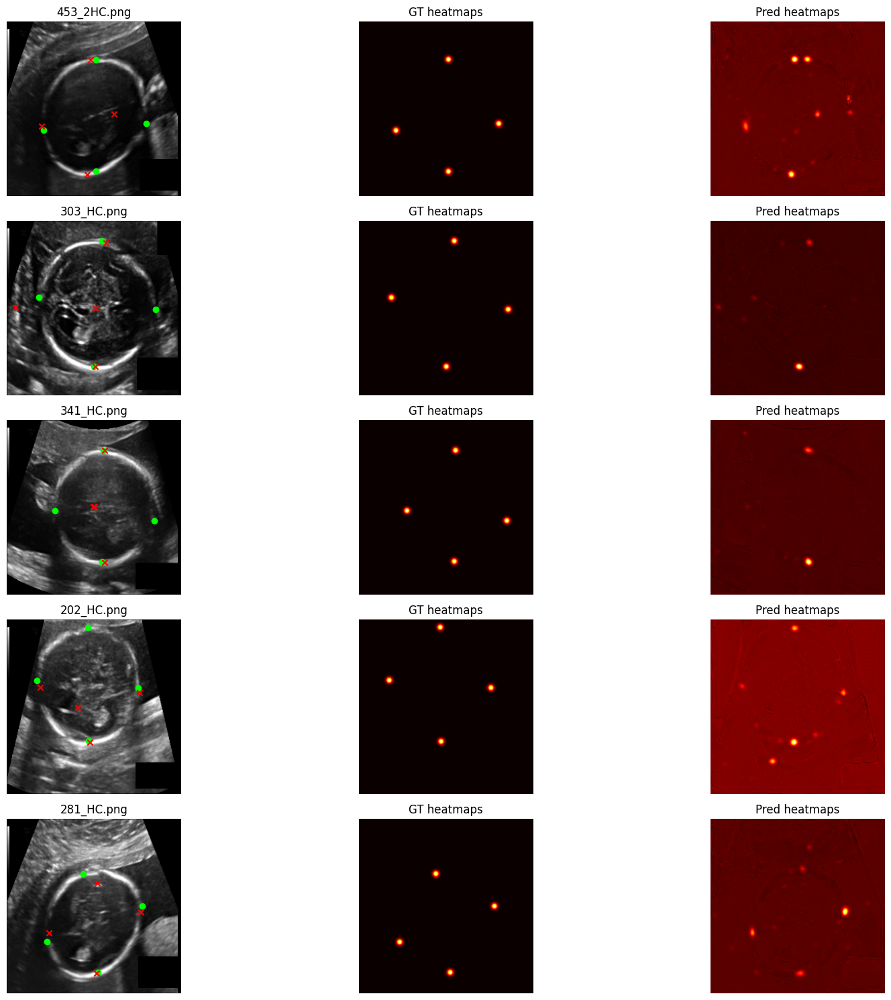


RUNNING: single_head_P0_A1


KeyboardInterrupt: 

In [30]:
np.random.seed(42)
indices = np.arange(len(core_df))
np.random.shuffle(indices)

val_size = int(0.15 * len(indices))
val_idx = indices[:val_size]
train_idx = indices[val_size:]

train_df = core_df.iloc[train_idx].reset_index(drop=True)
val_df = core_df.iloc[val_idx].reset_index(drop=True)

# ==========================================================
# RUN ALL EXPERIMENTS
# ==========================================================

summary = {}

for arch_name, arch_cls in ARCHS.items():
    for prep_name, preprocess in PREPS.items():
        for aug_name, aug_policy in AUGS.items():

            run_name = f"{arch_name}_{prep_name}_{aug_name}"
            run_dir = os.path.join(EXPERIMENT_ROOT, run_name)
            os.makedirs(run_dir, exist_ok=True)

            print("\n" + "="*60)
            print(f"RUNNING: {run_name}")
            print("="*60)

            train_dataset = UltrasoundHeatmapDataset(
                train_df, IMAGE_DIR, preprocess, aug_policy, augment=True
            )
            val_dataset = UltrasoundHeatmapDataset(
                val_df, IMAGE_DIR, preprocess, augment_policy=None, augment=False
            )

            train_loader = DataLoader(train_dataset, BATCH_SIZE, shuffle=True, num_workers=2)
            val_loader = DataLoader(val_dataset, BATCH_SIZE, shuffle=False, num_workers=2)

            in_channels = train_dataset[0][0].shape[0]
            model = arch_cls(in_channels).to(DEVICE)

            weights = torch.tensor([1.0, 1.0, 2.0, 2.0], device=DEVICE)
            criterion = WeightedHeatmapMSELoss(weights)
            optimizer = optim.AdamW(model.parameters(), lr=LR)

            best_val = float("inf")
            patience = 0

            epoch_bar = trange(EPOCHS, desc="Training", leave=False)

            for epoch in epoch_bar:
                model.train()
                train_losses = []

                for imgs, hms, _ in train_loader:
                    imgs = imgs.to(DEVICE)
                    hms = hms.to(DEVICE)

                    preds = model(imgs)
                    loss = criterion(preds, hms)

                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()

                    train_losses.append(loss.item())

                model.eval()
                val_losses = []

                with torch.no_grad():
                    for imgs, hms, _ in val_loader:
                        imgs = imgs.to(DEVICE)
                        hms = hms.to(DEVICE)
                        val_losses.append(criterion(model(imgs), hms).item())

                train_loss = float(np.mean(train_losses))
                val_loss = float(np.mean(val_losses))

                epoch_bar.set_postfix(train=f"{train_loss:.4f}", val=f"{val_loss:.4f}")

                if val_loss < best_val:
                    best_val = val_loss
                    patience = 0
                    torch.save(model.state_dict(), os.path.join(run_dir, "best_model.pth"))
                else:
                    patience += 1
                    if patience >= PATIENCE:
                        break

            model.load_state_dict(torch.load(os.path.join(run_dir, "best_model.pth"), map_location=DEVICE))

            metrics, per_image = evaluate_model(model, val_dataset, DEVICE, beta=BETA)

            print("\nEvaluation metrics:")
            for k, v in metrics.items():
                print(f"  {k}: {v}")

            with open(os.path.join(run_dir, "eval_metrics.json"), "w") as f:
                json.dump(to_python(metrics), f, indent=2)

            with open(os.path.join(run_dir, "per_image_metrics.json"), "w") as f:
                json.dump(to_python(per_image), f, indent=2)

            vis_path = os.path.join(run_dir, "visualization_samples.png")
            visualize_predictions(model, val_dataset, DEVICE, vis_path, k=K_VIS, beta=BETA)

            summary[run_name] = metrics

with open(os.path.join(EXPERIMENT_ROOT, "summary.json"), "w") as f:
    json.dump(to_python(summary), f, indent=2)

print("\nALL EXPERIMENTS COMPLETED SUCCESSFULLY ✔️")


In [31]:
# ==========================================================
# STAGED EXPERIMENT PIPELINE
# ==========================================================

summary = {}

def run_experiment_block(
    arch_names,
    prep_names,
    aug_names,
    block_name
):
    print("\n" + "#"*80)
    print(f"STARTING {block_name}")
    print("#"*80)

    block_results = {}

    for arch_name in arch_names:
        arch_cls = ARCHS[arch_name]

        for prep_name in prep_names:
            preprocess = PREPS[prep_name]

            for aug_name in aug_names:
                aug_policy = AUGS[aug_name]

                run_name = f"{block_name}__{arch_name}_{prep_name}_{aug_name}"
                run_dir = os.path.join(EXPERIMENT_ROOT, run_name)
                os.makedirs(run_dir, exist_ok=True)

                print("\n" + "="*60)
                print(f"RUNNING: {run_name}")
                print("="*60)

                # ------------------------------
                # Datasets
                # ------------------------------
                train_dataset = UltrasoundHeatmapDataset(
                    train_df, IMAGE_DIR, preprocess, aug_policy,
                    augment=(aug_name != "A0")
                )

                val_dataset = UltrasoundHeatmapDataset(
                    val_df, IMAGE_DIR, preprocess,
                    augment_policy=None, augment=False
                )

                train_loader = DataLoader(
                    train_dataset, BATCH_SIZE, shuffle=True, num_workers=2
                )
                val_loader = DataLoader(
                    val_dataset, BATCH_SIZE, shuffle=False, num_workers=2
                )

                in_channels = train_dataset[0][0].shape[0]
                model = arch_cls(in_channels).to(DEVICE)

                weights = torch.tensor([1.0, 1.0, 2.0, 2.0], device=DEVICE)
                criterion = WeightedHeatmapMSELoss(weights)
                optimizer = optim.AdamW(model.parameters(), lr=LR)

                best_val = float("inf")
                patience = 0

                epoch_bar = trange(EPOCHS, desc="Training", leave=False)

                # ------------------------------
                # Training
                # ------------------------------
                for epoch in epoch_bar:
                    model.train()
                    train_losses = []

                    for imgs, hms, _ in train_loader:
                        imgs = imgs.to(DEVICE)
                        hms = hms.to(DEVICE)

                        loss = criterion(model(imgs), hms)

                        optimizer.zero_grad()
                        loss.backward()
                        optimizer.step()

                        train_losses.append(loss.item())

                    model.eval()
                    val_losses = []

                    with torch.no_grad():
                        for imgs, hms, _ in val_loader:
                            imgs = imgs.to(DEVICE)
                            hms = hms.to(DEVICE)
                            val_losses.append(
                                criterion(model(imgs), hms).item()
                            )

                    train_loss = float(np.mean(train_losses))
                    val_loss = float(np.mean(val_losses))

                    epoch_bar.set_postfix(
                        train=f"{train_loss:.4f}",
                        val=f"{val_loss:.4f}"
                    )

                    if val_loss < best_val:
                        best_val = val_loss
                        patience = 0
                        torch.save(
                            model.state_dict(),
                            os.path.join(run_dir, "best_model.pth")
                        )
                    else:
                        patience += 1
                        if patience >= PATIENCE:
                            break

                # ------------------------------
                # Evaluation + visualization
                # ------------------------------
                model.load_state_dict(
                    torch.load(os.path.join(run_dir, "best_model.pth"),
                               map_location=DEVICE)
                )

                metrics, per_image = evaluate_model(
                    model, val_dataset, DEVICE, beta=BETA
                )

                print("\nEvaluation metrics:")
                for k, v in metrics.items():
                    print(f"  {k}: {v}")

                with open(os.path.join(run_dir, "eval_metrics.json"), "w") as f:
                    json.dump(to_python(metrics), f, indent=2)

                with open(os.path.join(run_dir, "per_image_metrics.json"), "w") as f:
                    json.dump(to_python(per_image), f, indent=2)

                visualize_predictions(
                    model,
                    val_dataset,
                    DEVICE,
                    save_path=os.path.join(run_dir, "visualization.png"),
                    k=K_VIS,
                    beta=BETA
                )

                block_results[run_name] = {
                    "arch": arch_name,
                    "best_val_loss": best_val,
                    **metrics
                }

    return block_results


/tmp/ipykernel_47/3657371883.py:41: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.register_buffer("weights", torch.tensor(weights, dtype=torch.float32))



################################################################################
STARTING STAGE1_BASELINE
################################################################################

RUNNING: STAGE1_BASELINE__single_head_P0_A0


/tmp/ipykernel_47/2337638326.py:47: RuntimeWarning: invalid value encountered in log
  return -(p * np.log(p + 1e-8)).sum()



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 36.044928619638085
  bpd_mean_L1: 16.392410278320312
  bpd_median_L1: 1.2854461669921875
  bpd_bias: -13.490524291992188
  bpd_loA: [-87.89696746826172, 60.915918884277346]
  ofd_mean_L1: 57.9665641784668
  ofd_median_L1: 47.18116760253906
  ofd_bias: -53.53840637207031
  ofd_loA: [-174.2324884033203, 67.15567565917968]


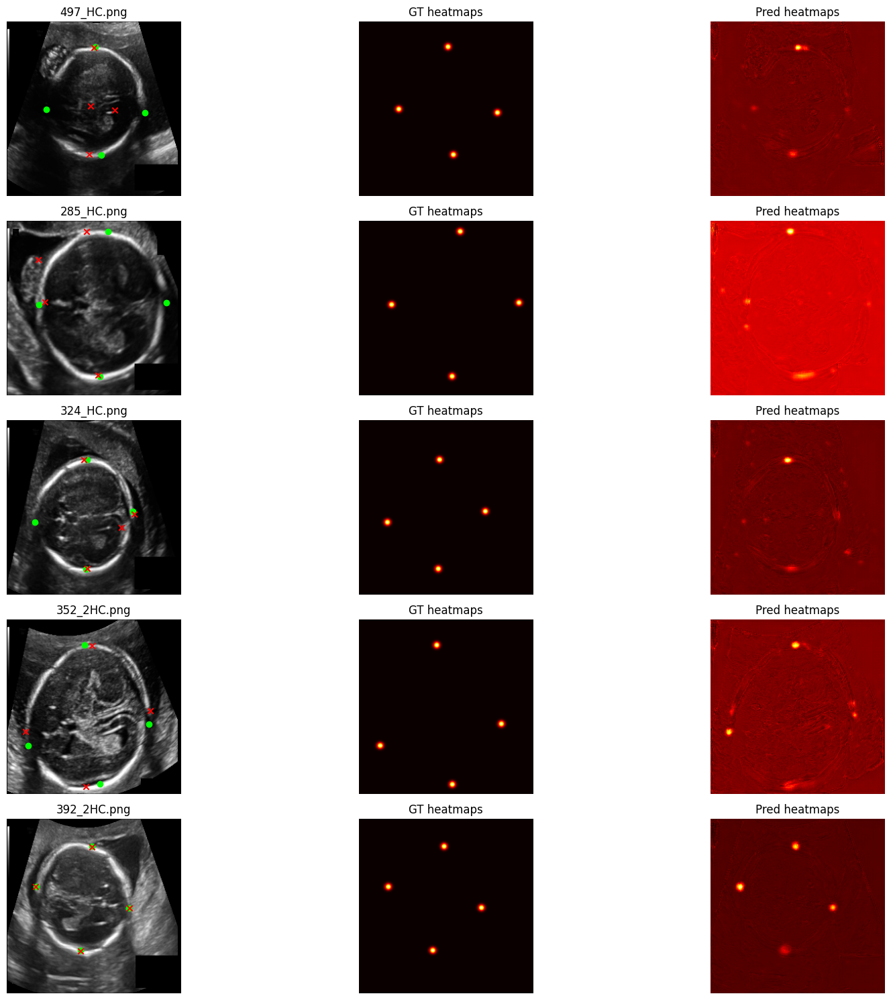


RUNNING: STAGE1_BASELINE__multi_head_P0_A0



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 30.84216432273388
  bpd_mean_L1: 15.875029563903809
  bpd_median_L1: 1.7279472351074219
  bpd_bias: -14.081310272216797
  bpd_loA: [-80.63908782958984, 52.47646728515625]
  ofd_mean_L1: 76.22116088867188
  ofd_median_L1: 77.33100128173828
  ofd_bias: -76.22116088867188
  ofd_loA: [-120.96722053527833, -31.475101242065428]


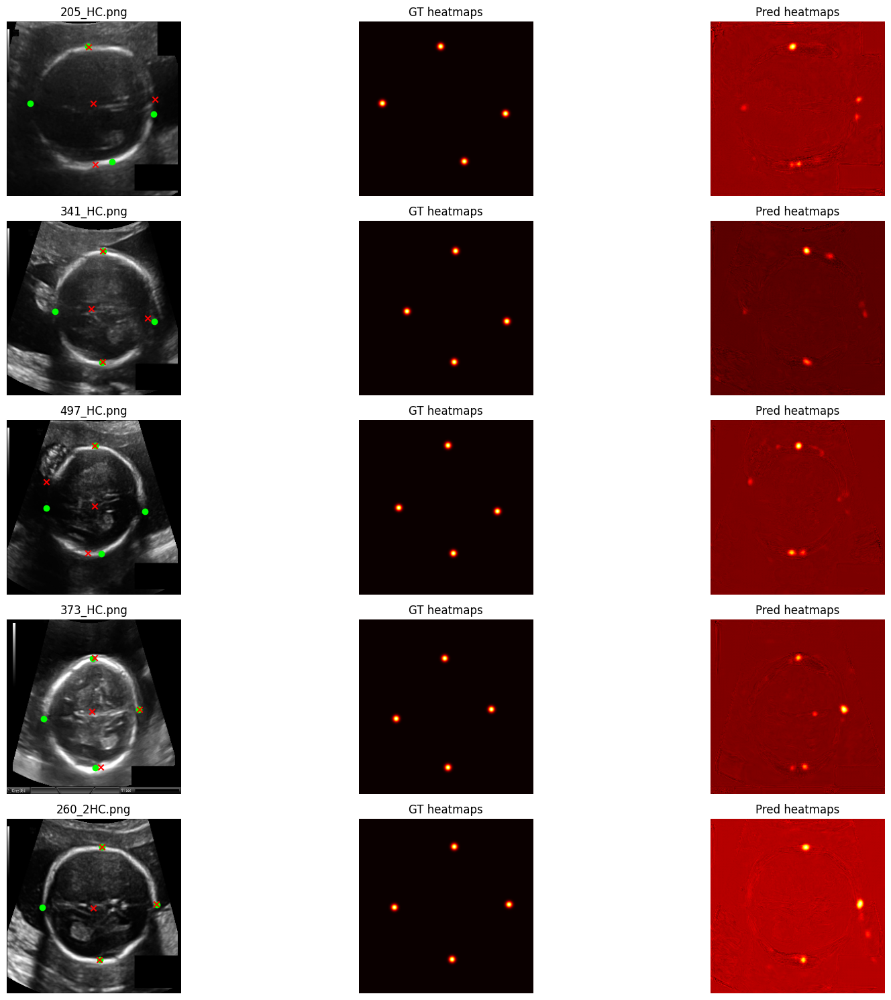


RUNNING: STAGE1_BASELINE__high_res_P0_A0



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 44.50073280930519
  bpd_mean_L1: 26.746334075927734
  bpd_median_L1: 3.3879470825195312
  bpd_bias: -25.24798583984375
  bpd_loA: [-118.01303237915039, 67.51706069946289]
  ofd_mean_L1: 124.82669067382812
  ofd_median_L1: 127.4763412475586
  ofd_bias: -124.82669067382812
  ofd_loA: [-191.24356033325193, -58.4098210144043]


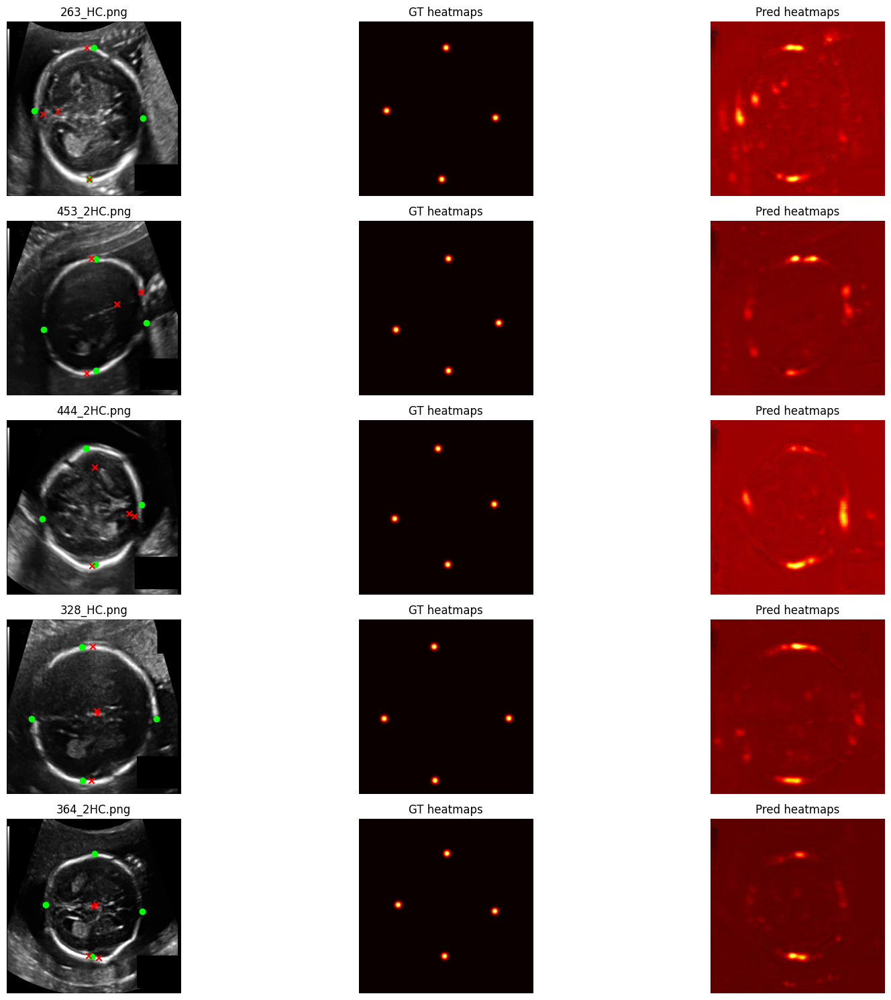

Top 2 architectures: ['multi_head', 'single_head']


In [32]:
stage1_results = run_experiment_block(
    arch_names=list(ARCHS.keys()),
    prep_names=["P0"],
    aug_names=["A0"],
    block_name="STAGE1_BASELINE"
)

# Select best 2 architectures
sorted_stage1 = sorted(
    stage1_results.items(),
    key=lambda x: x[1]["best_val_loss"]
)

top2_archs = [
    sorted_stage1[0][1]["arch"],
    sorted_stage1[1][1]["arch"],
]

print("Top 2 architectures:", top2_archs)


/tmp/ipykernel_47/3657371883.py:41: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.register_buffer("weights", torch.tensor(weights, dtype=torch.float32))



################################################################################
STARTING STAGE2_REFINED
################################################################################

RUNNING: STAGE2_REFINED__multi_head_P1_A2


/tmp/ipykernel_47/2337638326.py:47: RuntimeWarning: invalid value encountered in log 
  return -(p * np.log(p + 1e-8)).sum()



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 35.24617988988757
  bpd_mean_L1: 8.564362525939941
  bpd_median_L1: 1.223876953125
  bpd_bias: -7.415828227996826
  bpd_loA: [-57.7733359336853, 42.94167947769165]
  ofd_mean_L1: 115.01685333251953
  ofd_median_L1: 135.34228515625
  ofd_bias: -115.01465606689453
  ofd_loA: [-224.46933319091795, -5.559978942871098]


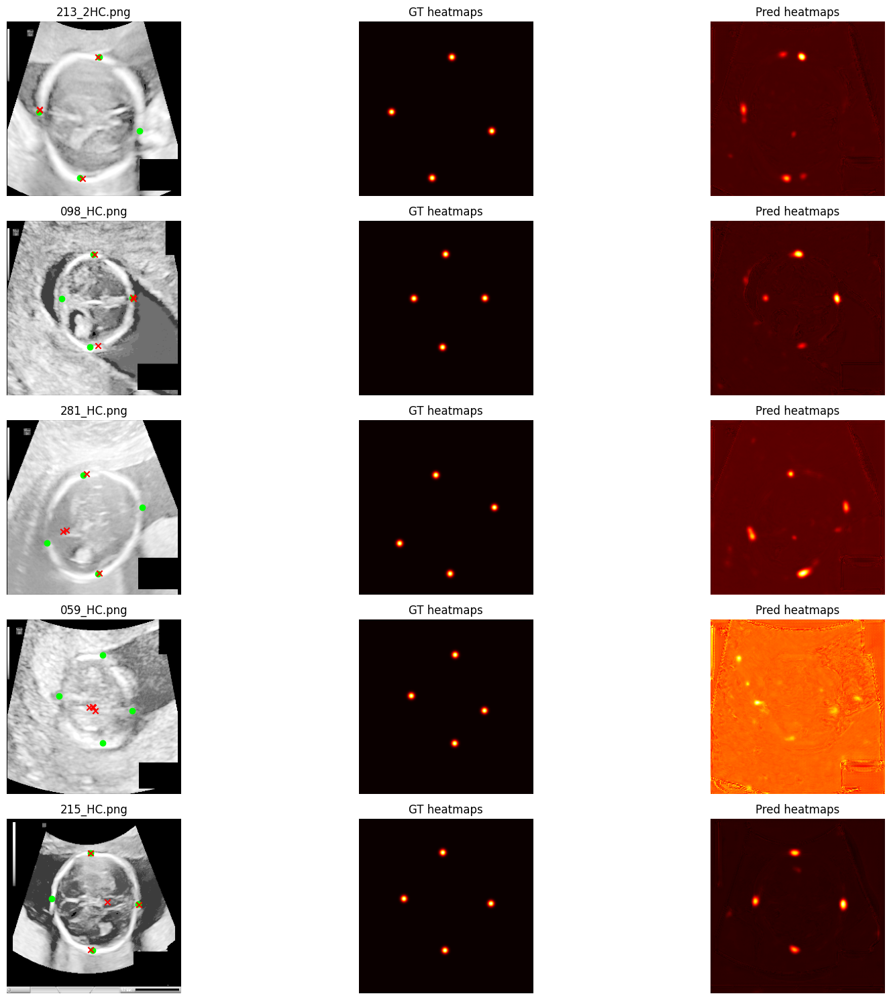


RUNNING: STAGE2_REFINED__single_head_P1_A2



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 83.37862277030945
  bpd_mean_L1: 148.31919860839844
  bpd_median_L1: 155.59439086914062
  bpd_bias: -148.31919860839844
  bpd_loA: [-211.88518432617187, -84.75321289062501]
  ofd_mean_L1: 126.88958740234375
  ofd_median_L1: 133.75909423828125
  ofd_bias: -126.88958740234375
  ofd_loA: [-178.25207138061523, -75.52710342407227]


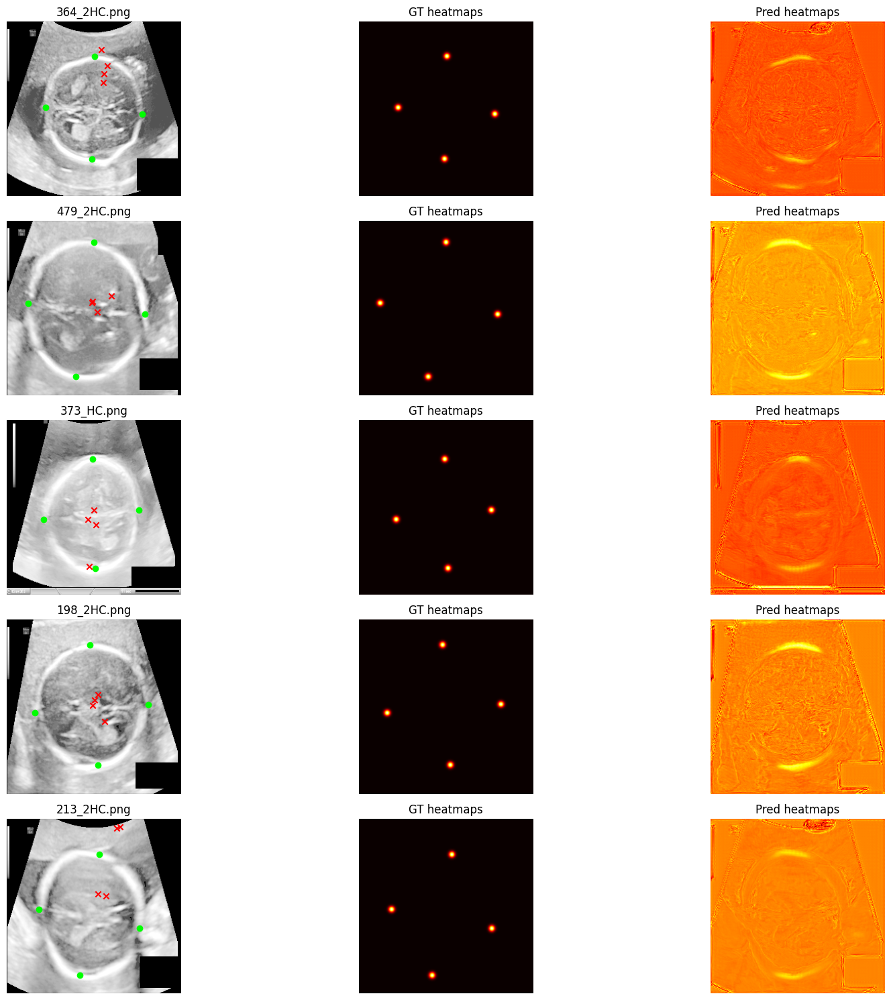

Best architecture after Stage 2: multi_head


In [33]:
stage2_results = run_experiment_block(
    arch_names=top2_archs,
    prep_names=["P1"],
    aug_names=["A2"],
    block_name="STAGE2_REFINED"
)

best_arch = min(
    stage2_results.items(),
    key=lambda x: x[1]["best_val_loss"]
)[1]["arch"]

print("Best architecture after Stage 2:", best_arch)


/tmp/ipykernel_47/3657371883.py:41: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.register_buffer("weights", torch.tensor(weights, dtype=torch.float32))



################################################################################
STARTING STAGE3_FULL
################################################################################

RUNNING: STAGE3_FULL__multi_head_P0_A0


/tmp/ipykernel_47/2337638326.py:47: RuntimeWarning: invalid value encountered in log
  return -(p * np.log(p + 1e-8)).sum()



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 21.138614755589515
  bpd_mean_L1: 19.365079879760742
  bpd_median_L1: 2.3688888549804688
  bpd_bias: -17.163585662841797
  bpd_loA: [-89.69492797851562, 55.36775665283203]
  ofd_mean_L1: 26.777694702148438
  ofd_median_L1: 2.7232818603515625
  ofd_bias: -25.233613967895508
  ofd_loA: [-107.15179542541503, 56.684567489624015]


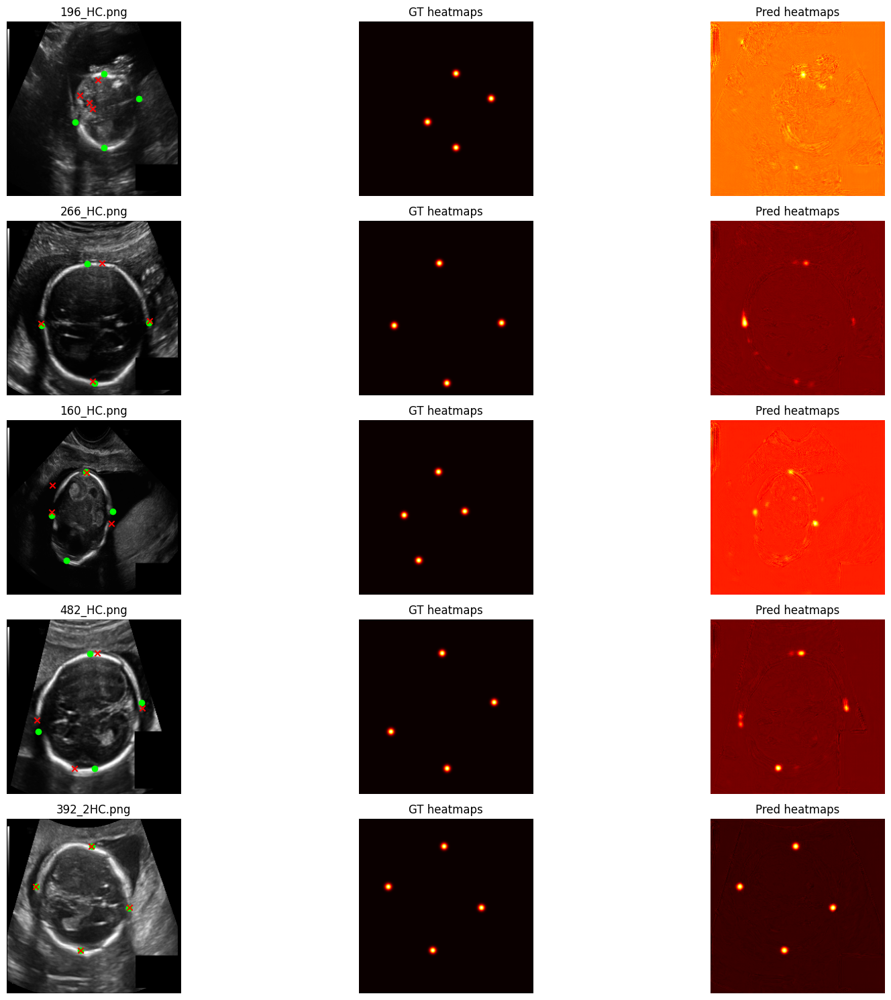


RUNNING: STAGE3_FULL__multi_head_P0_A1



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 13.612667069770396
  bpd_mean_L1: 6.1028642654418945
  bpd_median_L1: 1.35614013671875
  bpd_bias: -4.852411270141602
  bpd_loA: [-37.19720016479492, 27.492377624511718]
  ofd_mean_L1: 16.597904205322266
  ofd_median_L1: 2.4606475830078125
  ofd_bias: -13.008832931518555
  ofd_loA: [-77.33511268615723, 51.31744682312012]


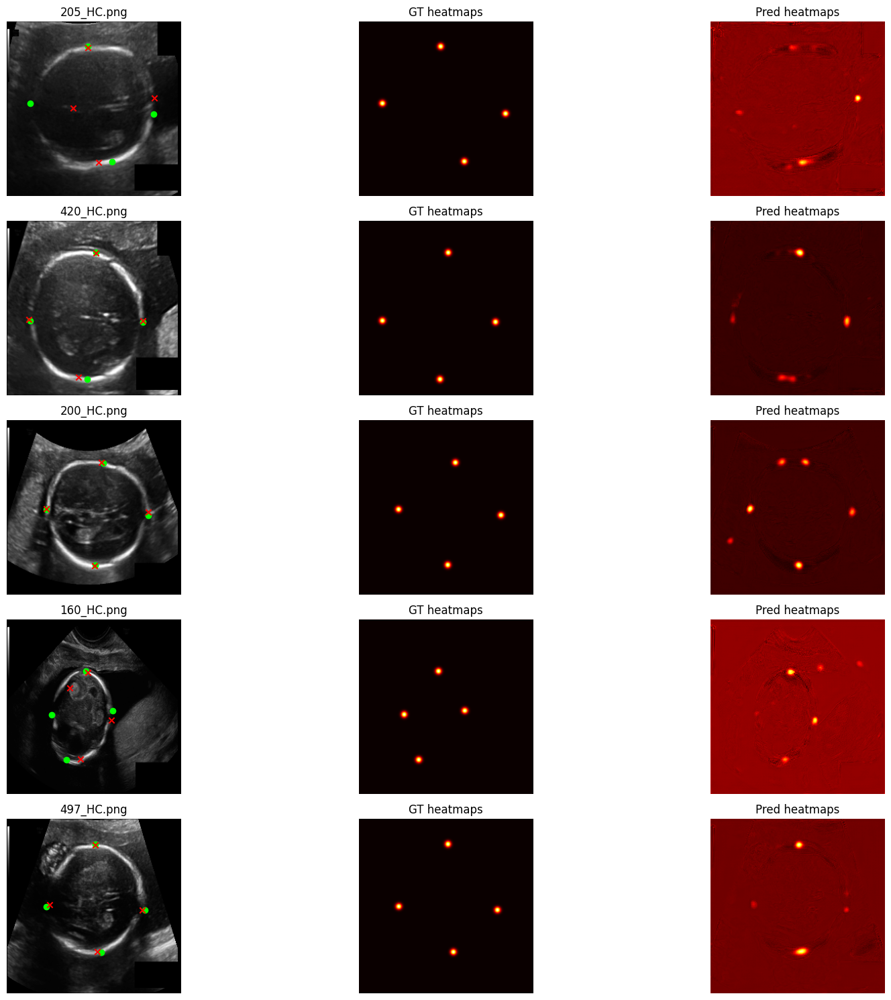


RUNNING: STAGE3_FULL__multi_head_P0_A2



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 43.43207994103432
  bpd_mean_L1: 4.851868629455566
  bpd_median_L1: 0.9868240356445312
  bpd_bias: -3.308342218399048
  bpd_loA: [-33.128600435256956, 26.51191599845886]
  ofd_mean_L1: 144.37197875976562
  ofd_median_L1: 148.14456176757812
  ofd_bias: -144.11569213867188
  ofd_loA: [-209.29338577270508, -78.93799850463867]


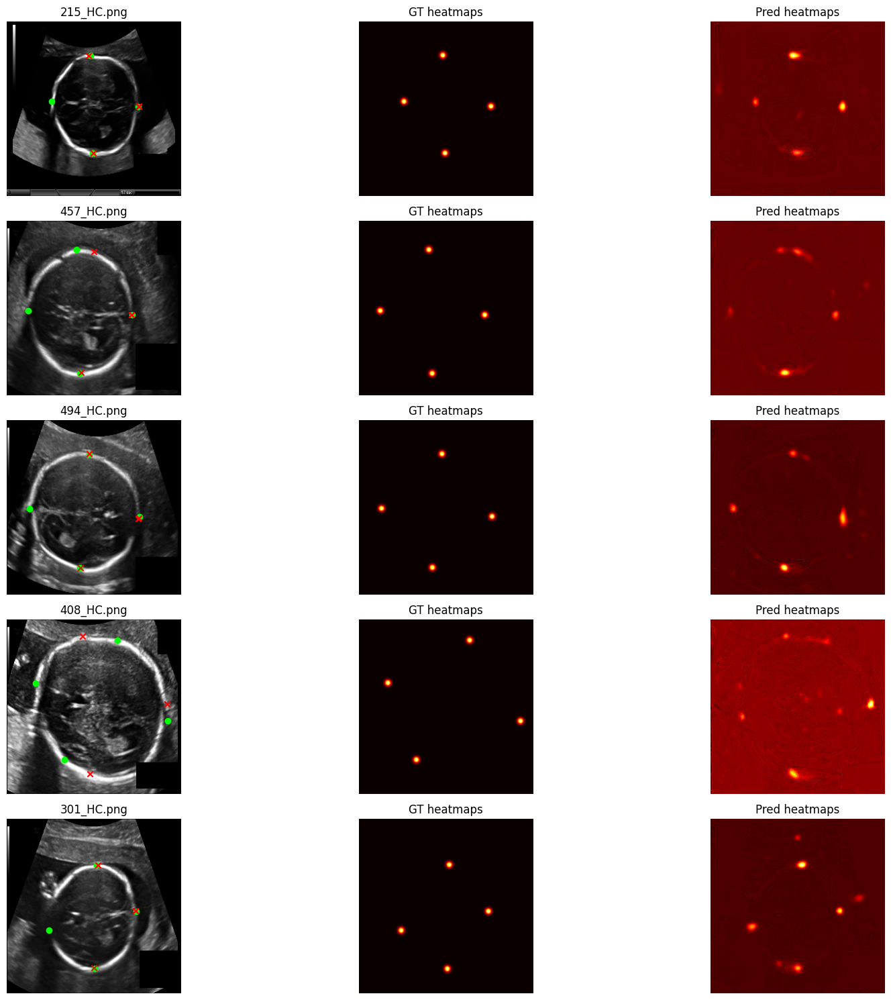


RUNNING: STAGE3_FULL__multi_head_P0_A3



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 42.45244097709656
  bpd_mean_L1: 6.049192428588867
  bpd_median_L1: 0.9457931518554688
  bpd_bias: -4.76912784576416
  bpd_loA: [-39.20119815826416, 29.662942466735842]
  ofd_mean_L1: 141.83938598632812
  ofd_median_L1: 145.20306396484375
  ofd_bias: -141.35574340820312
  ofd_loA: [-211.1576400756836, -71.55384674072266]


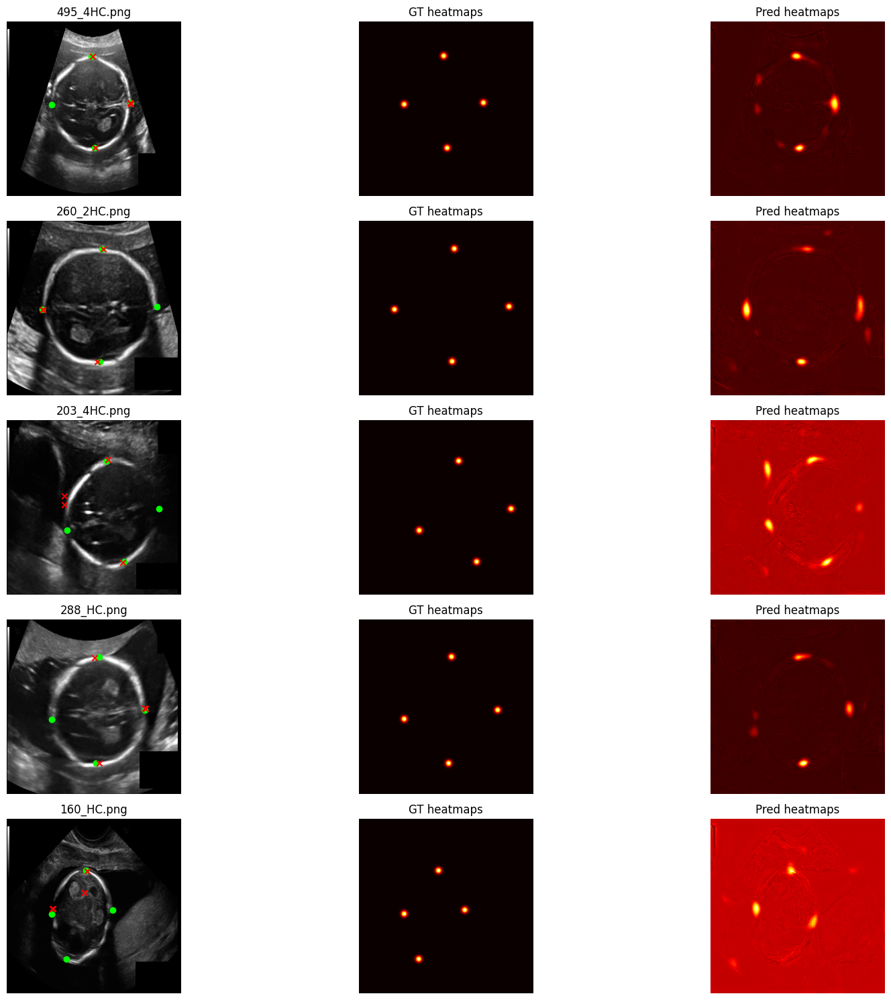


RUNNING: STAGE3_FULL__multi_head_P1_A0



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 25.29054026119411
  bpd_mean_L1: 23.767925262451172
  bpd_median_L1: 2.8408737182617188
  bpd_bias: -20.235794067382812
  bpd_loA: [-100.64105865478516, 60.16947052001953]
  ofd_mean_L1: 23.846418380737305
  ofd_median_L1: 4.7556610107421875
  ofd_bias: -13.745611190795898
  ofd_loA: [-97.36190254211425, 69.87068016052245]


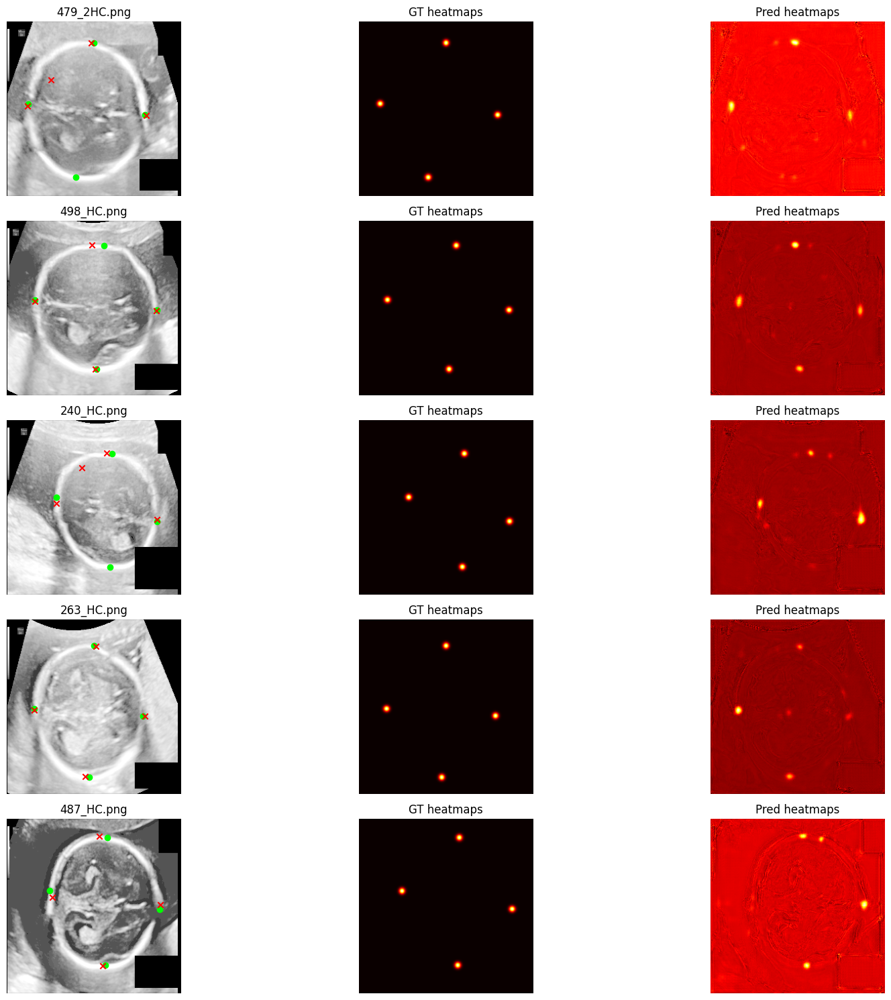


RUNNING: STAGE3_FULL__multi_head_P1_A1



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 86.61569344997406
  bpd_mean_L1: 98.58882141113281
  bpd_median_L1: 95.24000549316406
  bpd_bias: -98.58882141113281
  bpd_loA: [-154.42404701232908, -42.75359580993653]
  ofd_mean_L1: 123.22659301757812
  ofd_median_L1: 126.19075012207031
  ofd_bias: -123.22659301757812
  ofd_loA: [-179.77978645324708, -66.67339958190918]


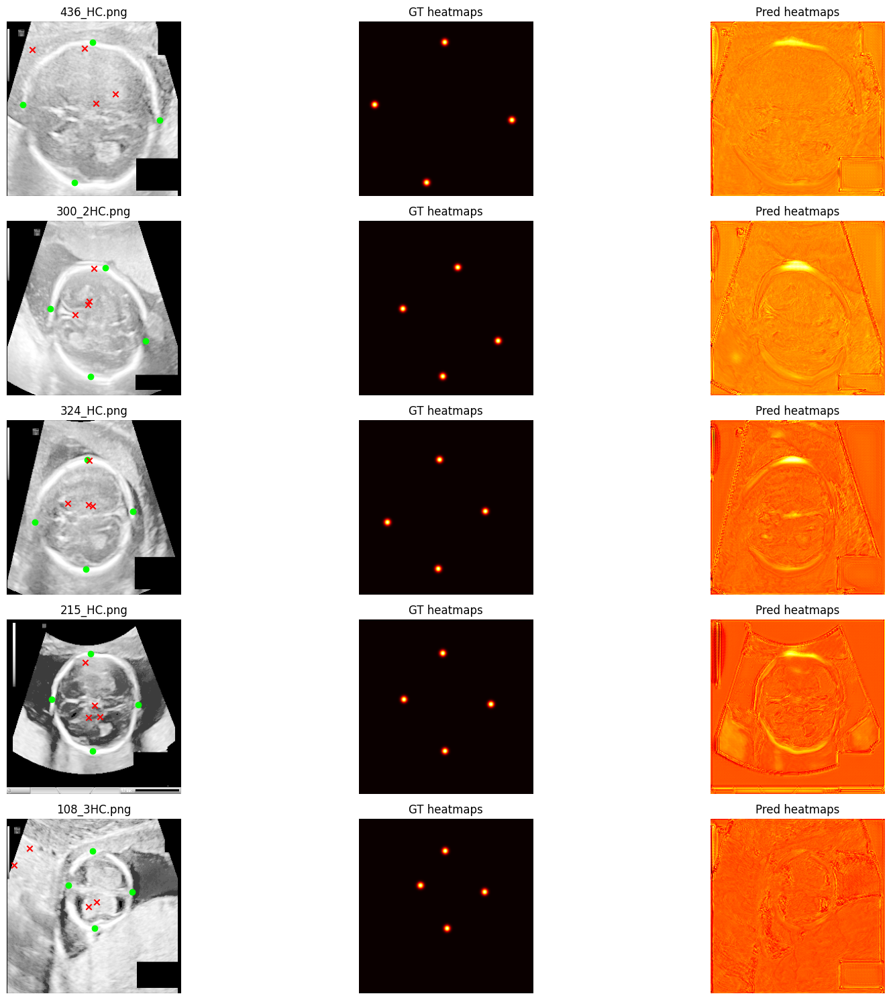


RUNNING: STAGE3_FULL__multi_head_P1_A2



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 42.66133597493172
  bpd_mean_L1: 5.21679162979126
  bpd_median_L1: 1.4088592529296875
  bpd_bias: -3.554752826690674
  bpd_loA: [-35.44549394607544, 28.33598829269409]
  ofd_mean_L1: 142.05589294433594
  ofd_median_L1: 146.0387420654297
  ofd_bias: -142.05589294433594
  ofd_loA: [-197.03029884338378, -87.08148704528809]


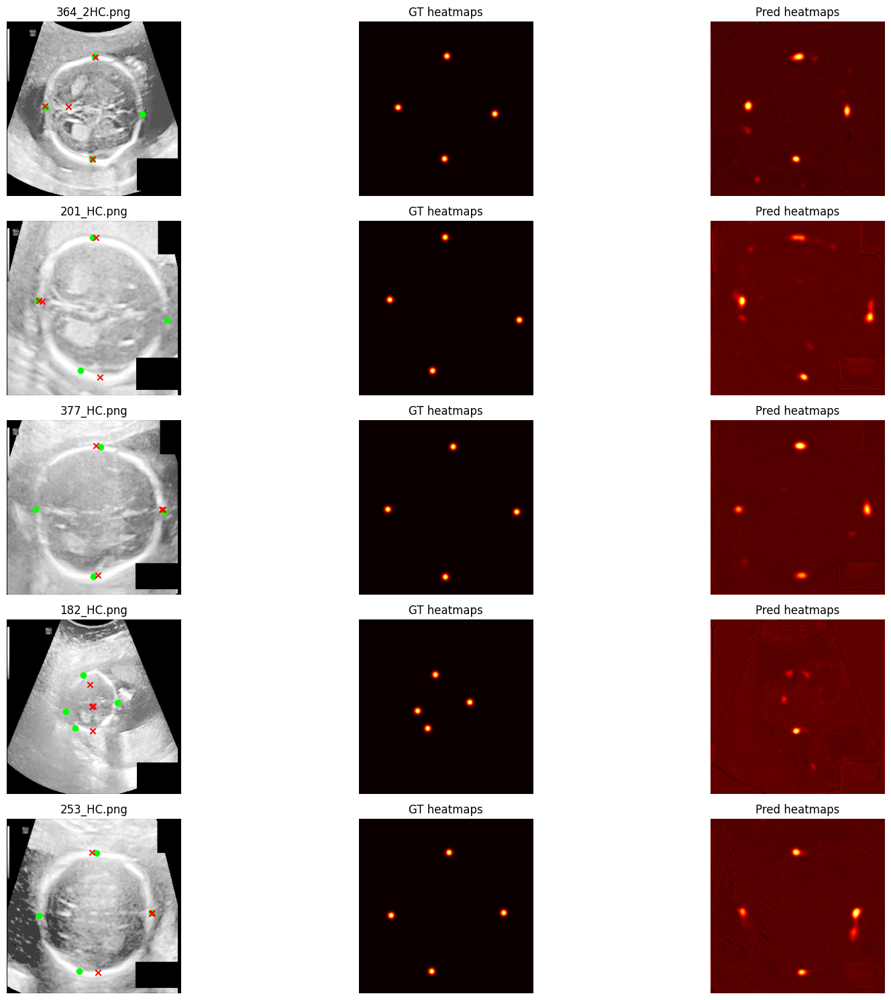


RUNNING: STAGE3_FULL__multi_head_P1_A3



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 44.114314049482346
  bpd_mean_L1: 8.499984741210938
  bpd_median_L1: 1.3322525024414062
  bpd_bias: -7.227182865142822
  bpd_loA: [-50.10222398757934, 35.6478582572937]
  ofd_mean_L1: 142.33499145507812
  ofd_median_L1: 147.05889892578125
  ofd_bias: -142.33499145507812
  ofd_loA: [-199.01323822021484, -85.6567446899414]


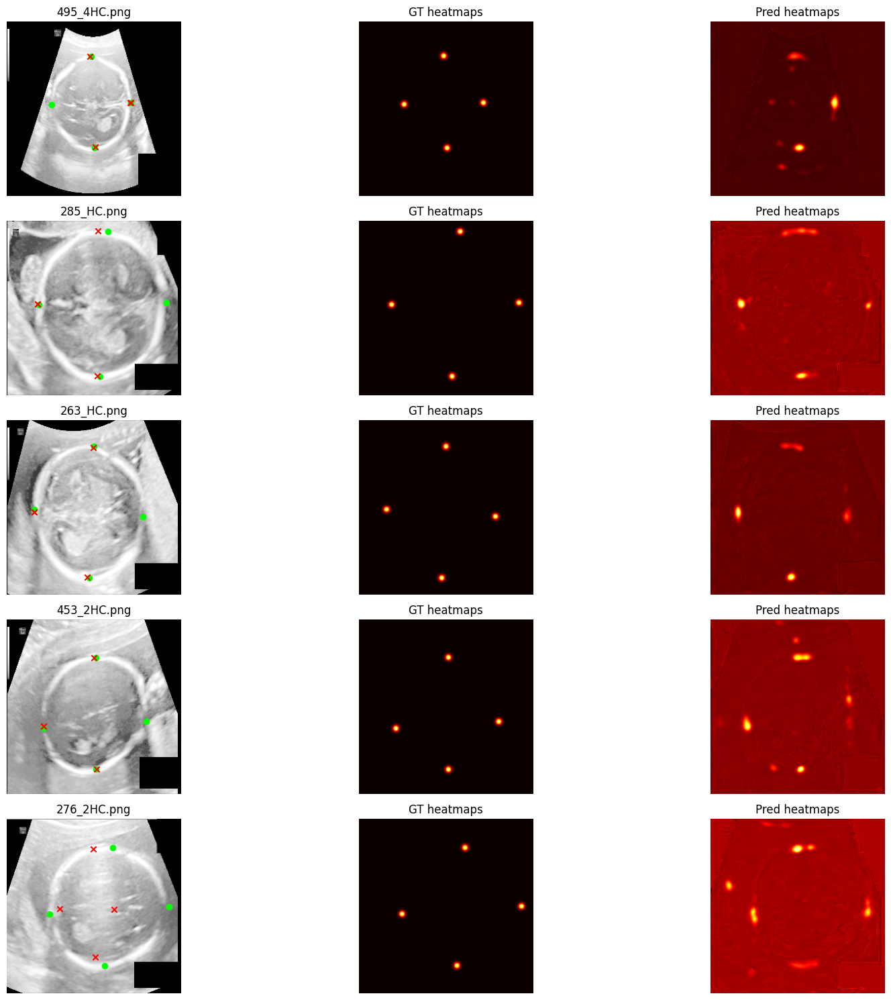


RUNNING: STAGE3_FULL__multi_head_P2_A0



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 26.77477031107992
  bpd_mean_L1: 19.308639526367188
  bpd_median_L1: 2.5058135986328125
  bpd_bias: -15.646040916442871
  bpd_loA: [-89.66180599212646, 58.36972415924072]
  ofd_mean_L1: 37.001373291015625
  ofd_median_L1: 7.823814392089844
  ofd_bias: -35.10321044921875
  ofd_loA: [-125.68364624023437, 55.47722534179687]


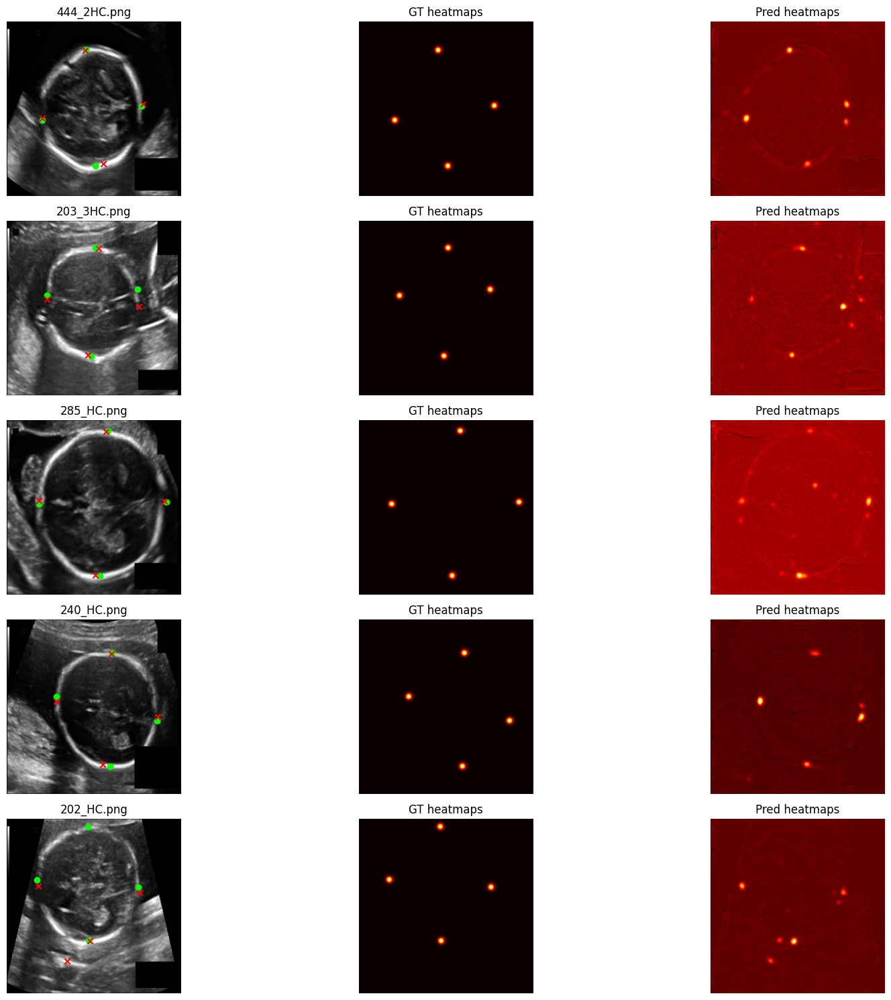


RUNNING: STAGE3_FULL__multi_head_P2_A1



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 19.83924701716751
  bpd_mean_L1: 9.619477272033691
  bpd_median_L1: 1.188507080078125
  bpd_bias: -6.402848720550537
  bpd_loA: [-59.209623699188235, 46.40392625808716]
  ofd_mean_L1: 26.63503646850586
  ofd_median_L1: 5.141288757324219
  ofd_bias: -14.080111503601074
  ofd_loA: [-99.67930431365967, 71.51908130645752]


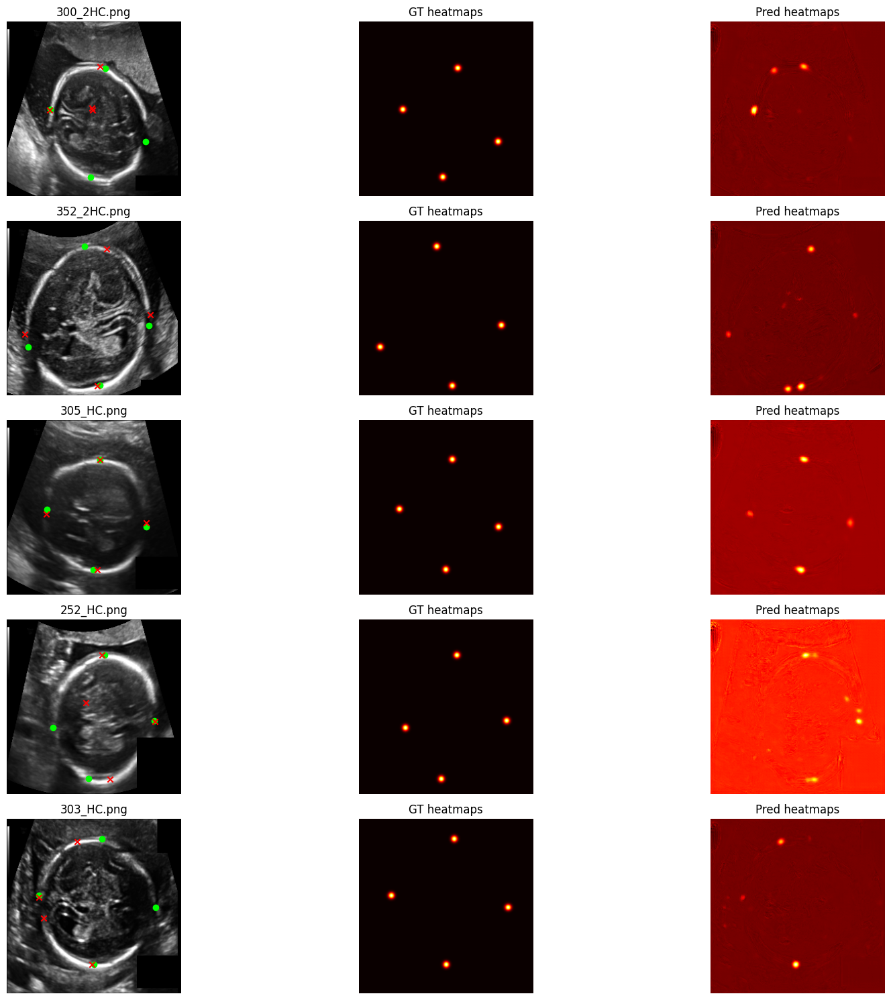


RUNNING: STAGE3_FULL__multi_head_P2_A2



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 47.67193549871445
  bpd_mean_L1: 4.6846604347229
  bpd_median_L1: 0.9101486206054688
  bpd_bias: -3.543762683868408
  bpd_loA: [-27.233572177886963, 20.146046810150146]
  ofd_mean_L1: 130.63792419433594
  ofd_median_L1: 139.2767333984375
  ofd_bias: -127.99967956542969
  ofd_loA: [-229.15309753417966, -26.846261596679696]


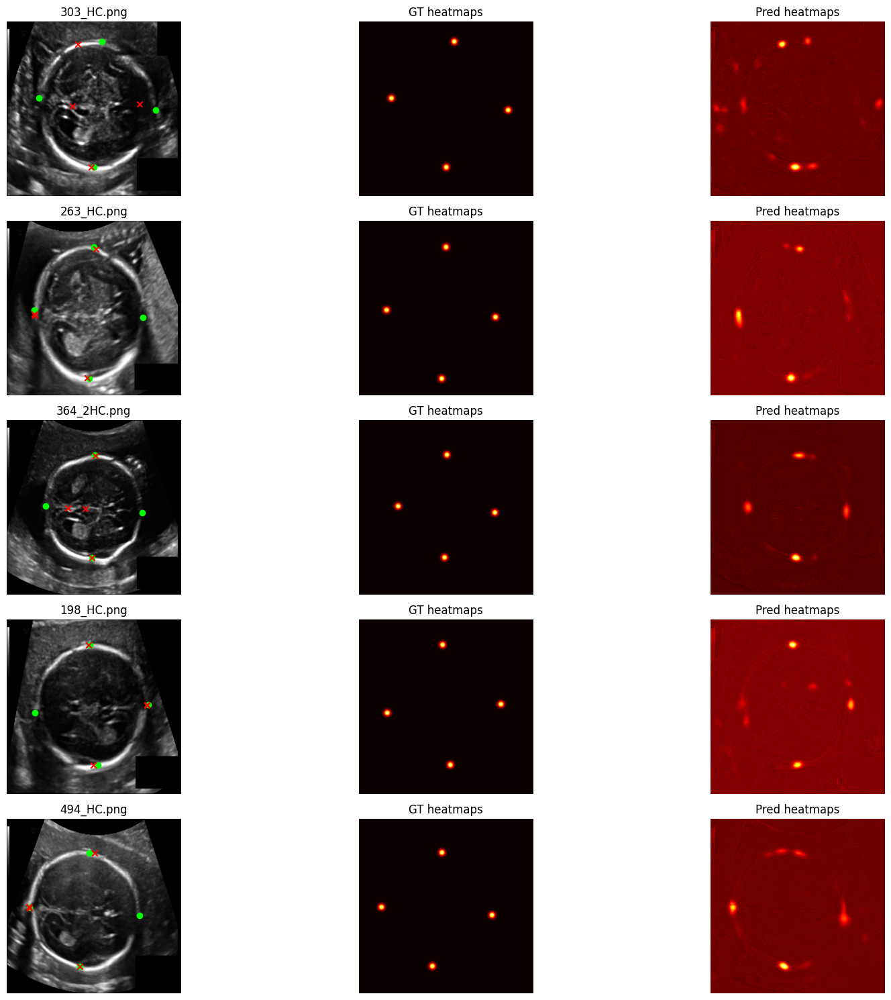


RUNNING: STAGE3_FULL__multi_head_P2_A3



Evaluation metrics:
  num_samples: 64
  landmark_mean_error: 33.10785876214504
  bpd_mean_L1: 3.6855416297912598
  bpd_median_L1: 1.1316680908203125
  bpd_bias: -2.452381134033203
  bpd_loA: [-27.46565643310547, 22.560894165039063]
  ofd_mean_L1: 99.86981201171875
  ofd_median_L1: 113.29032135009766
  ofd_bias: -99.64430236816406
  ofd_loA: [-218.18066024780273, 18.89205551147461]


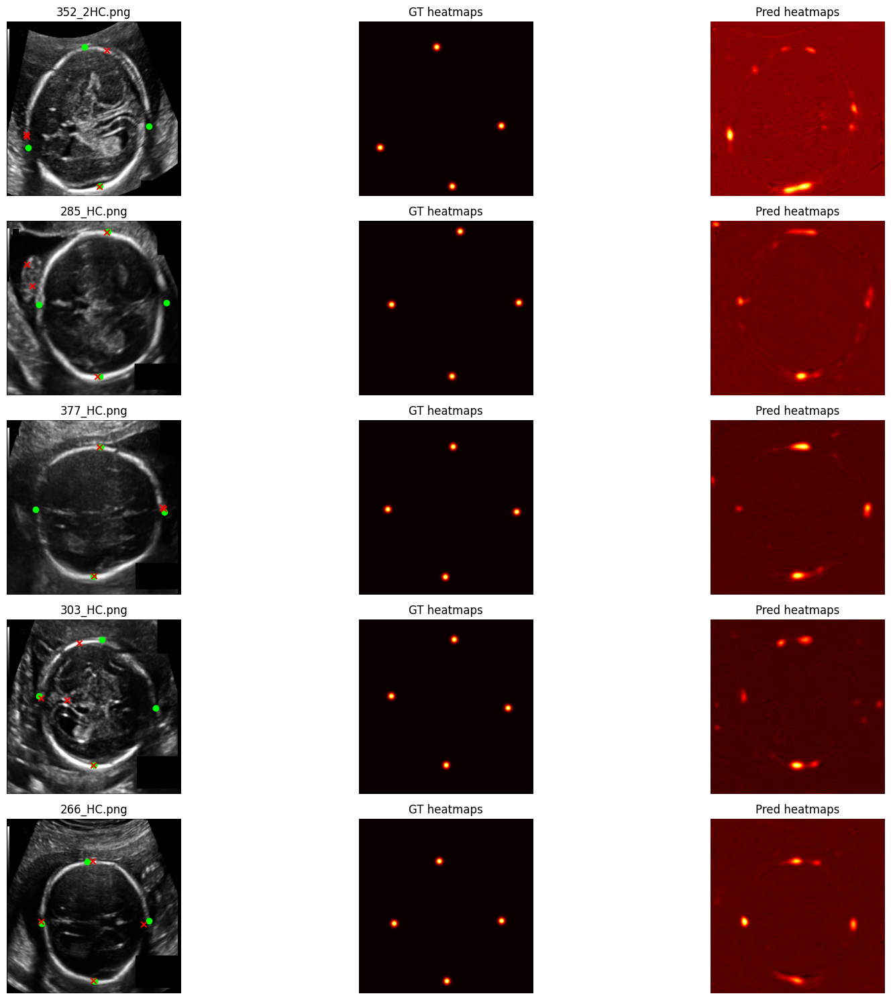


ALL STAGED EXPERIMENTS COMPLETED ✔️


In [34]:
stage3_results = run_experiment_block(
    arch_names=[best_arch],
    prep_names=["P0", "P1", "P2"],
    aug_names=["A0", "A1", "A2", "A3"],
    block_name="STAGE3_FULL"
)

summary.update(stage1_results)
summary.update(stage2_results)
summary.update(stage3_results)

with open(os.path.join(EXPERIMENT_ROOT, "summary.json"), "w") as f:
    json.dump(to_python(summary), f, indent=2)

print("\nALL STAGED EXPERIMENTS COMPLETED ✔️")


In [37]:
import shutil
import os

shutil.make_archive(
    base_name="/kaggle/working/all_outputs_new",
    format="zip",
    root_dir="/kaggle/working"
)


KeyboardInterrupt: 

In [38]:
print(h)


540
